INFO: Using YAML: data/data.yaml
INFO: Classes found: ['Paper', 'Rock', 'Scissors']
INFO: Number of classes: 3
INFO: Analyzing split: test
INFO: Counts for test: {'Paper': 40, 'Rock': 25, 'Scissors': 29}
INFO: Analyzing split: train
INFO: Counts for train: {'Paper': 197, 'Rock': 201, 'Scissors': 173}
INFO: Analyzing split: valid
INFO: Counts for valid: {'Paper': 61, 'Rock': 61, 'Scissors': 47}
INFO: === FINAL SUMMARY ===
INFO: test: 94 bounding boxes
INFO: train: 571 bounding boxes
INFO: valid: 169 bounding boxes
INFO: Total by class:
INFO:   Paper: 298
INFO:   Rock: 287
INFO:   Scissors: 249
INFO: Grand total: 834 bounding boxes
INFO: Comprehensive plot saved to: analysis/class_distribution_analysis.png


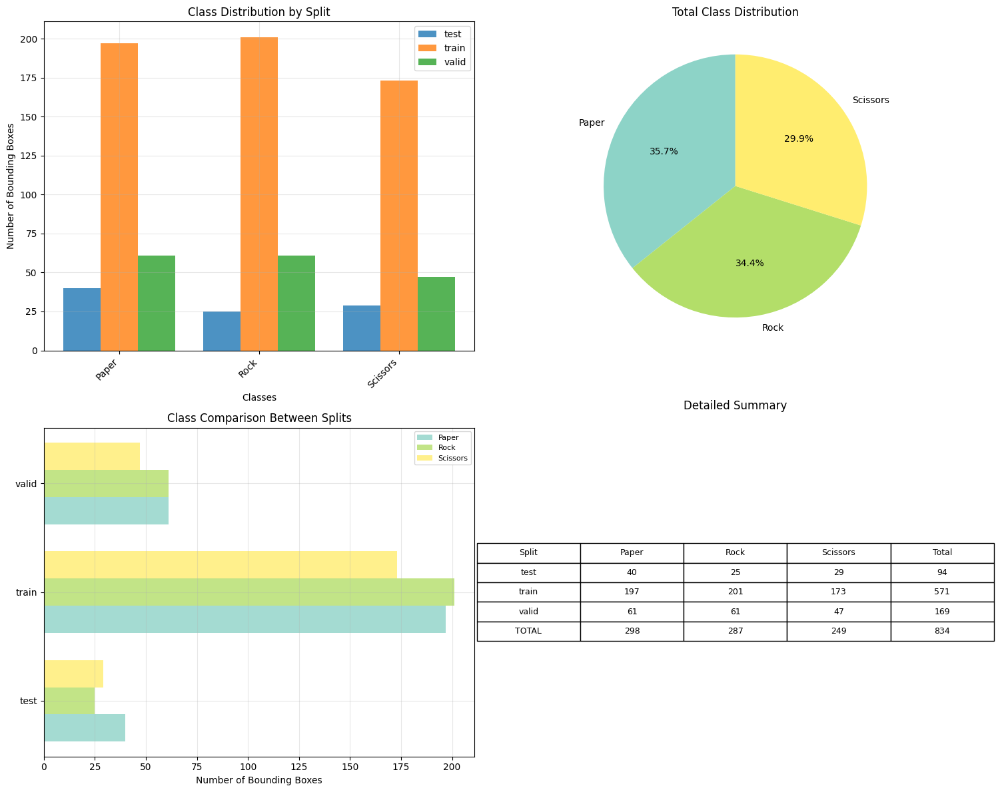

INFO: Simple plot saved to: analysis/simple_class_distribution.png


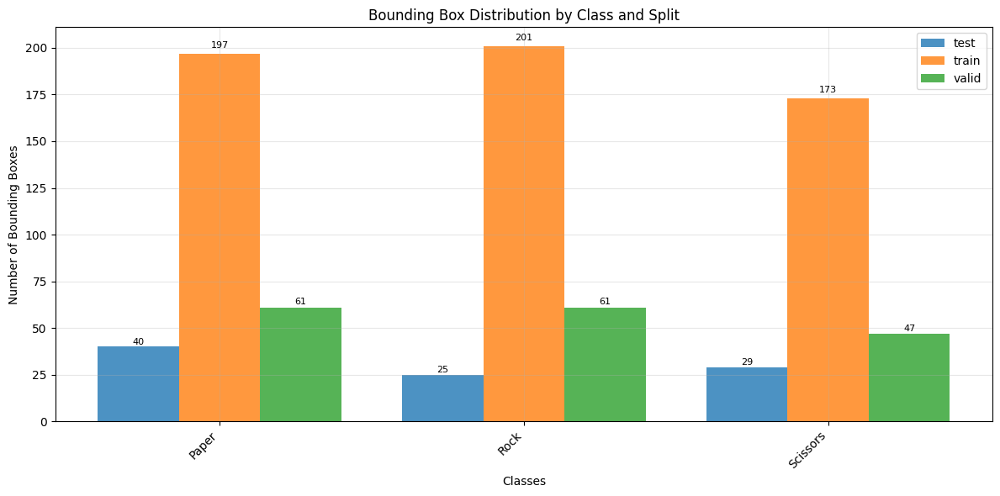

In [1]:
import sys
import logging
import yaml
from pathlib import Path
import matplotlib.pyplot as plt
from collections import defaultdict
from typing import Dict, List, Tuple, Optional
import numpy as np

logging.basicConfig(level=logging.INFO, format="%(levelname)s: %(message)s")


class DatasetAnalyzer:
    """Main class for dataset analysis operations."""
    
    def __init__(self, base_path: Path):
        self.base_path = base_path
        self.data_yaml_path = self._find_data_yaml()
        self.config = self._load_config()
        self.class_names = self.config.get("names", [])
        self.data_root = base_path / "data"
        self.analysis_dir = base_path / "analysis"
    
    def _find_data_yaml(self) -> Path:
        """Find data.yml / data.yaml in common locations."""
        candidates = [
            self.base_path / "data" / "data.yml",
            self.base_path / "data" / "data.yaml",
            self.base_path / "data.yml",
            self.base_path / "data.yaml",
        ]
        for candidate in candidates:
            if candidate.exists():
                return candidate
        raise FileNotFoundError(
            f"No configuration file found. Searched: {', '.join(str(p) for p in candidates)}"
        )
    
    def _load_config(self) -> dict:
        """Load YAML configuration file."""
        if not self.data_yaml_path.exists():
            raise FileNotFoundError(f"YAML file not found: {self.data_yaml_path}")
        with open(self.data_yaml_path, "r") as f:
            return yaml.safe_load(f) or {}
    
    def analyze_and_plot(self) -> None:
        """Main method to run complete analysis and generate plots."""
        self._log_dataset_info()
        results = self._analyze_dataset()
        
        if not results:
            logging.error("No data found for analysis.")
            sys.exit(1)
        
        self._log_final_summary(results)
        plotter = DatasetPlotter(self.class_names, self.analysis_dir)
        plotter.create_all_plots(results)
    
    def _log_dataset_info(self) -> None:
        """Log basic dataset information."""
        logging.info("Using YAML: %s", self.data_yaml_path)
        logging.info("Classes found: %s", self.class_names)
        logging.info("Number of classes: %d", len(self.class_names))
    
    def _analyze_dataset(self) -> Dict[str, Dict[str, int]]:
        """Analyze entire dataset and return counts by split."""
        if not self.class_names:
            logging.warning("No classes defined in 'names' in YAML.")
        
        splits = self._detect_splits()
        if not splits:
            logging.error("No splits detected. Check folder structure in %s or YAML config.", self.data_root)
            return {}
        
        results = {}
        for split in splits:
            logging.info("Analyzing split: %s", split)
            counts = self._count_classes_in_split(split)
            results[split] = counts
            logging.info("Counts for %s: %s", split, counts)
        
        return results
    
    def _detect_splits(self) -> List[str]:
        """Detect splits by looking for subfolders containing 'labels'."""
        if not self.data_root.exists():
            return []
        
        splits = []
        for directory in sorted(self.data_root.iterdir()):
            if directory.is_dir() and (directory / "labels").exists():
                splits.append(directory.name)
        
        if not splits:
            splits = self._extract_splits_from_config()
        
        return splits
    
    def _extract_splits_from_config(self) -> List[str]:
        """Extract split names from config paths."""
        splits = []
        for split_key in ["train", "val", "test"]:
            if split_key in self.config:
                val = self.config[split_key]
                if isinstance(val, str):
                    path = Path(val)
                    parts = [p for p in path.parts if p and p not in (".", "/", "images", "labels")]
                    split_name = parts[-1] if parts else split_key
                else:
                    split_name = split_key
                splits.append(split_name)
        return splits
    
    def _count_classes_in_split(self, split_name: str) -> Dict[str, int]:
        """Count bounding boxes of each class in a specific split."""
        labels_dir = self.data_root / split_name / "labels"
        
        if not labels_dir.exists():
            logging.warning("Labels directory not found: %s", labels_dir)
            return {}
        
        class_counts = {class_name: 0 for class_name in self.class_names}
        
        for label_file in sorted(labels_dir.glob("*.txt")):
            annotations = YOLOLabelReader.read_labels(label_file)
            for annotation in annotations:
                class_id = annotation[0]
                if 0 <= class_id < len(self.class_names):
                    class_name = self.class_names[class_id]
                    class_counts[class_name] += 1
        
        return class_counts
    
    def _log_final_summary(self, results: Dict[str, Dict[str, int]]) -> None:
        """Log final analysis summary."""
        logging.info("=== FINAL SUMMARY ===")
        
        total_by_class = defaultdict(int)
        grand_total = 0
        
        for split, counts in results.items():
            split_total = sum(counts.values())
            logging.info("%s: %d bounding boxes", split, split_total)
            for class_name, count in counts.items():
                total_by_class[class_name] += count
        
        logging.info("Total by class:")
        for class_name in self.class_names:
            total = total_by_class.get(class_name, 0)
            logging.info("  %s: %d", class_name, total)
            grand_total += total
        
        logging.info("Grand total: %d bounding boxes", grand_total)


class YOLOLabelReader:
    """Handles reading YOLO label files."""
    
    @staticmethod
    def read_labels(label_path: Path) -> List[Tuple[int, float, float, float, float]]:
        """Read YOLO label file and return list of (class_id, x_center, y_center, width, height)."""
        annotations = []
        
        try:
            with open(label_path, "r") as f:
                for line in f:
                    line = line.strip()
                    if not line or line.startswith("#"):
                        continue
                    
                    annotation = YOLOLabelReader._parse_annotation_line(line)
                    if annotation:
                        annotations.append(annotation)
        
        except Exception as e:
            logging.warning("Error reading %s: %s", label_path, e)
        
        return annotations
    
    @staticmethod
    def _parse_annotation_line(line: str) -> Optional[Tuple[int, float, float, float, float]]:
        """Parse a single annotation line."""
        parts = line.split()
        if len(parts) < 5:
            return None
        
        try:
            class_id = int(float(parts[0]))
            x_center = float(parts[1])
            y_center = float(parts[2])
            width = float(parts[3])
            height = float(parts[4])
            return (class_id, x_center, y_center, width, height)
        except Exception:
            return None


class DatasetPlotter:
    """Handles all plotting operations for dataset analysis."""
    
    def __init__(self, class_names: List[str], output_dir: Path):
        self.class_names = class_names
        self.output_dir = output_dir
        self.colors = plt.cm.Set3(np.linspace(0, 1, max(1, len(class_names))))
    
    def create_all_plots(self, results: Dict[str, Dict[str, int]]) -> None:
        """Create all analysis plots."""
        self.output_dir.mkdir(parents=True, exist_ok=True)
        
        if not results:
            logging.warning("No results to plot.")
            return
        
        self._create_comprehensive_plot(results)
        self._create_simple_bar_plot(results)
    
    def _create_comprehensive_plot(self, results: Dict[str, Dict[str, int]]) -> None:
        """Create comprehensive 4-subplot analysis plot."""
        fig, axes = plt.subplots(2, 2, figsize=(15, 12))
        
        self._plot_distribution_by_split(axes[0, 0], results)
        self._plot_total_distribution_pie(axes[0, 1], results)
        self._plot_horizontal_comparison(axes[1, 0], results)
        self._plot_summary_table(axes[1, 1], results)
        
        plt.tight_layout()
        output_path = self.output_dir / "class_distribution_analysis.png"
        plt.savefig(output_path, dpi=300, bbox_inches="tight")
        logging.info("Comprehensive plot saved to: %s", output_path)
        plt.show()
    
    def _plot_distribution_by_split(self, ax, results: Dict[str, Dict[str, int]]) -> None:
        """Plot bar chart showing distribution by split."""
        splits = list(results.keys())
        x_pos = np.arange(len(self.class_names))
        width = 0.8 / max(1, len(splits))
        
        for i, split in enumerate(splits):
            counts = [results[split].get(class_name, 0) for class_name in self.class_names]
            ax.bar(x_pos + i * width, counts, width, label=split, alpha=0.8)
        
        ax.set_xlabel("Classes")
        ax.set_ylabel("Number of Bounding Boxes")
        ax.set_title("Class Distribution by Split")
        ax.set_xticks(x_pos + width * (len(splits) - 1) / 2)
        ax.set_xticklabels(self.class_names, rotation=45, ha="right")
        ax.legend()
        ax.grid(True, alpha=0.3)
    
    def _plot_total_distribution_pie(self, ax, results: Dict[str, Dict[str, int]]) -> None:
        """Plot pie chart showing total distribution across all classes."""
        total_counts = self._calculate_total_counts(results)
        class_totals = [total_counts.get(class_name, 0) for class_name in self.class_names]
        
        if sum(class_totals) == 0:
            ax.text(0.5, 0.5, "No data", ha="center", va="center")
        else:
            ax.pie(class_totals, labels=self.class_names, autopct="%1.1f%%", 
                   colors=self.colors, startangle=90)
        
        ax.set_title("Total Class Distribution")
    
    def _plot_horizontal_comparison(self, ax, results: Dict[str, Dict[str, int]]) -> None:
        """Plot horizontal bar chart comparing classes between splits."""
        splits = list(results.keys())
        y_pos = np.arange(len(splits))
        
        for i, class_name in enumerate(self.class_names):
            counts = [results[split].get(class_name, 0) for split in splits]
            ax.barh(y_pos + i * 0.25, counts, 0.25, label=class_name, 
                   color=self.colors[i % len(self.colors)], alpha=0.8)
        
        ax.set_yticks(y_pos + 0.25)
        ax.set_yticklabels(splits)
        ax.set_xlabel("Number of Bounding Boxes")
        ax.set_title("Class Comparison Between Splits")
        ax.legend(fontsize=8)
        ax.grid(True, alpha=0.3)
    
    def _plot_summary_table(self, ax, results: Dict[str, Dict[str, int]]) -> None:
        """Plot summary table with detailed counts."""
        ax.axis("off")
        
        splits = list(results.keys())
        headers = ["Split"] + self.class_names + ["Total"]
        table_data = self._prepare_table_data(results, splits)
        
        table = ax.table(cellText=table_data, colLabels=headers, 
                        cellLoc="center", loc="center")
        table.auto_set_font_size(False)
        table.set_fontsize(9)
        table.scale(1.2, 1.5)
        ax.set_title("Detailed Summary", pad=20)
    
    def _create_simple_bar_plot(self, results: Dict[str, Dict[str, int]]) -> None:
        """Create simple bar plot with value annotations."""
        fig, ax = plt.subplots(figsize=(12, 6))
        
        splits = list(results.keys())
        x_pos = np.arange(len(self.class_names))
        width = 0.8 / max(1, len(splits))
        
        for i, split in enumerate(splits):
            counts = [results[split].get(class_name, 0) for class_name in self.class_names]
            ax.bar(x_pos + i * width, counts, width, label=split, alpha=0.8)
            self._add_value_annotations(ax, x_pos, i, width, counts)
        
        ax.set_xlabel("Classes")
        ax.set_ylabel("Number of Bounding Boxes")
        ax.set_title("Bounding Box Distribution by Class and Split")
        ax.set_xticks(x_pos + width * (len(splits) - 1) / 2)
        ax.set_xticklabels(self.class_names, rotation=45, ha="right")
        ax.legend()
        ax.grid(True, alpha=0.3)
        
        plt.tight_layout()
        output_path = self.output_dir / "simple_class_distribution.png"
        plt.savefig(output_path, dpi=300, bbox_inches="tight")
        logging.info("Simple plot saved to: %s", output_path)
        plt.show()
    
    def _calculate_total_counts(self, results: Dict[str, Dict[str, int]]) -> Dict[str, int]:
        """Calculate total counts across all splits."""
        total_counts = defaultdict(int)
        for split_data in results.values():
            for class_name, count in split_data.items():
                total_counts[class_name] += count
        return dict(total_counts)
    
    def _prepare_table_data(self, results: Dict[str, Dict[str, int]], splits: List[str]) -> List[List[str]]:
        """Prepare data for summary table."""
        table_data = []
        
        # Add data rows
        for split in splits:
            row = [split]
            split_total = 0
            for class_name in self.class_names:
                count = results[split].get(class_name, 0)
                row.append(str(count))
                split_total += count
            row.append(str(split_total))
            table_data.append(row)
        
        # Add total row
        total_row = ["TOTAL"]
        grand_total = 0
        for class_name in self.class_names:
            class_total = sum(results[split].get(class_name, 0) for split in splits)
            total_row.append(str(class_total))
            grand_total += class_total
        total_row.append(str(grand_total))
        table_data.append(total_row)
        
        return table_data
    
    def _add_value_annotations(self, ax, x_pos: np.ndarray, split_index: int, 
                              width: float, counts: List[int]) -> None:
        """Add value annotations on top of bars."""
        max_count = max(counts) if counts else 0
        for j, count in enumerate(counts):
            if count > 0:
                ax.text(j + split_index * width, count + max_count * 0.01, str(count),
                       ha="center", va="bottom", fontsize=8)
try:
    analyzer = DatasetAnalyzer(Path("."))
    analyzer.analyze_and_plot()
except FileNotFoundError as e:
    logging.error(str(e))
    sys.exit(1)
except Exception as e:
    logging.error("Unexpected error: %s", e)
    sys.exit(1)

INFO: Classes: ['Paper', 'Rock', 'Scissors']
INFO: Creating examples for split: TRAIN
INFO: Examples saved to: analysis/examples_train.png


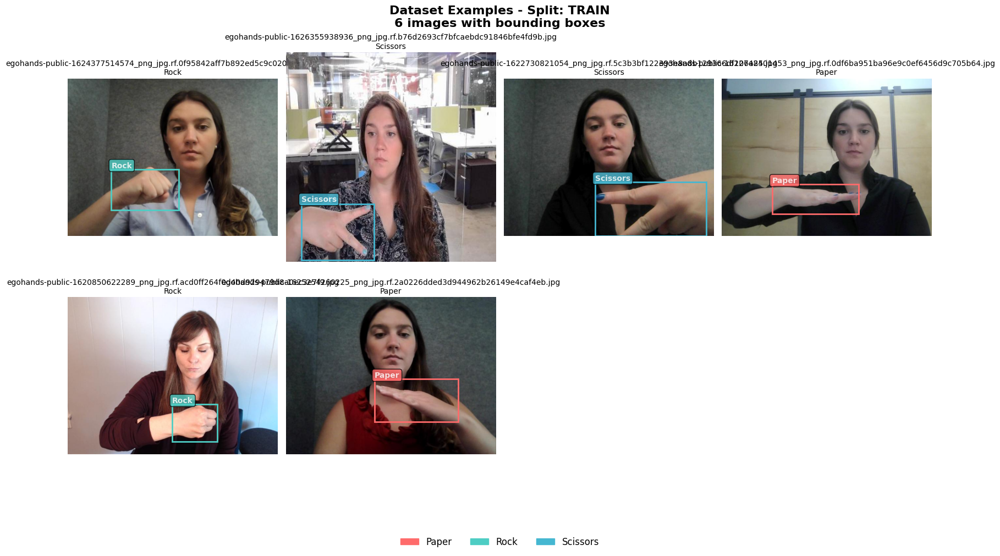

INFO: Creating examples for split: VALID
INFO: Examples saved to: analysis/examples_valid.png


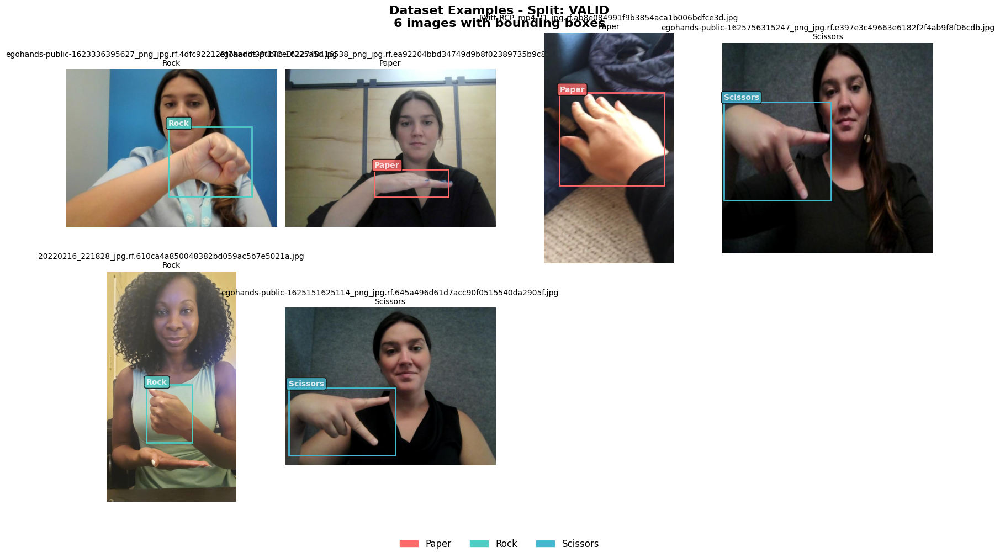

INFO: Creating examples for split: TEST
INFO: Examples saved to: analysis/examples_test.png


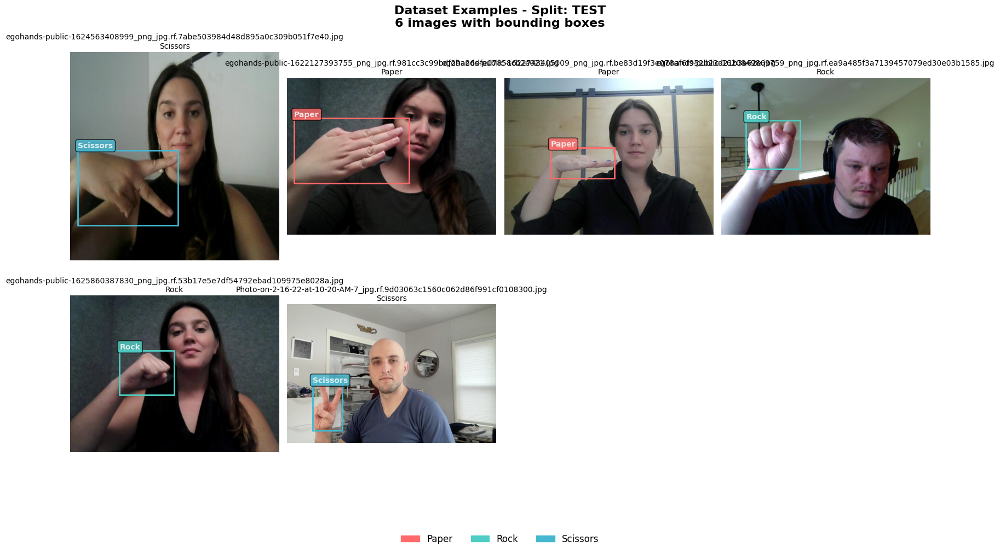

INFO: Creating combined examples from all splits
INFO: Combined examples saved to: analysis/examples_combined.png


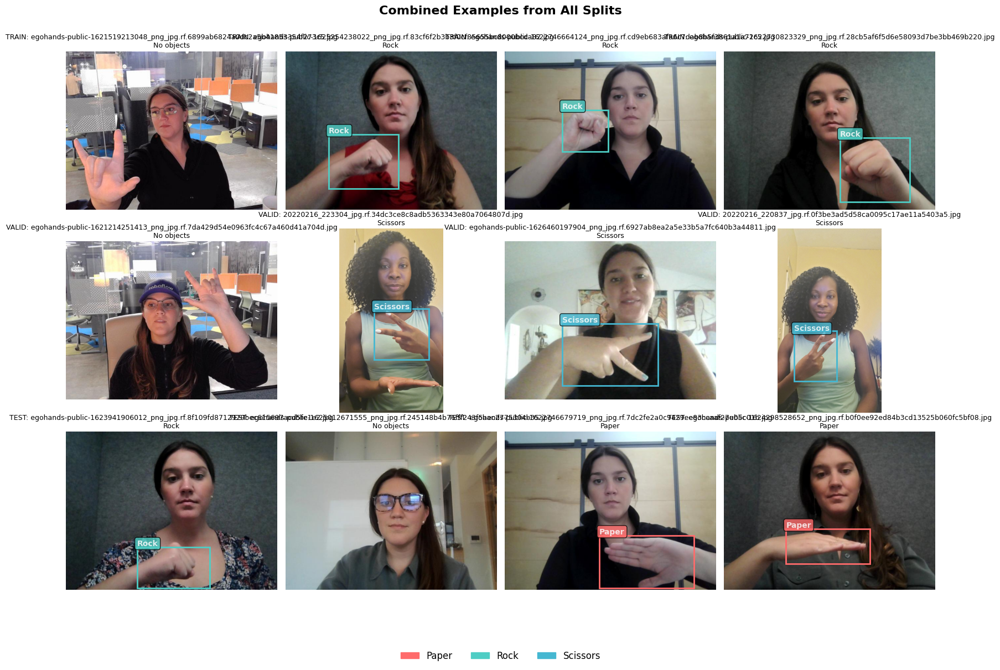

In [ ]:
import random
import logging
from pathlib import Path
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
from typing import List, Tuple, Dict, Optional, Set
import numpy as np
import yaml

logging.basicConfig(level=logging.INFO, format="%(levelname)s: %(message)s")


class YOLOAnnotation:
    """Represents a single YOLO annotation."""
    
    def __init__(self, class_id: int, x_center: float, y_center: float, width: float, height: float):
        self.class_id = class_id
        self.x_center = x_center
        self.y_center = y_center
        self.width = width
        self.height = height
    
    def to_pixel_coordinates(self, image_width: int, image_height: int) -> Tuple[float, float, float, float]:
        """Convert normalized coordinates to pixel coordinates (xmin, ymin, width, height)."""
        pixel_width = self.width * image_width
        pixel_height = self.height * image_height
        center_x = self.x_center * image_width
        center_y = self.y_center * image_height
        xmin = center_x - pixel_width / 2
        ymin = center_y - pixel_height / 2
        return xmin, ymin, pixel_width, pixel_height


class YOLOLabelReader:
    """Handles reading and parsing YOLO label files."""
    
    @staticmethod
    def read_annotations(label_path: Path) -> List[YOLOAnnotation]:
        """Read YOLO label file and return list of annotations."""
        annotations = []
        
        try:
            with open(label_path, 'r') as f:
                for line in f:
                    line = line.strip()
                    if not line or line.startswith('#'):
                        continue
                    
                    annotation = YOLOLabelReader._parse_annotation_line(line)
                    if annotation:
                        annotations.append(annotation)
        
        except Exception as e:
            logging.warning("Error reading %s: %s", label_path, e)
        
        return annotations
    
    @staticmethod
    def _parse_annotation_line(line: str) -> Optional[YOLOAnnotation]:
        """Parse a single annotation line."""
        parts = line.split()
        if len(parts) < 5:
            return None
        
        try:
            class_id = int(parts[0])
            x_center = float(parts[1])
            y_center = float(parts[2])
            width = float(parts[3])
            height = float(parts[4])
            return YOLOAnnotation(class_id, x_center, y_center, width, height)
        except (ValueError, IndexError):
            return None


class ImageFinder:
    """Handles finding and validating image files."""
    
    SUPPORTED_EXTENSIONS = ('jpg', 'jpeg', 'png', 'bmp', 'tiff', 'webp')
    
    @staticmethod
    def find_corresponding_image(label_path: Path, images_dir: Path) -> Optional[Path]:
        """Find the image file corresponding to a label file."""
        image_name = label_path.stem
        
        for ext in ImageFinder.SUPPORTED_EXTENSIONS:
            candidate = images_dir / f"{image_name}.{ext}"
            if candidate.exists():
                return candidate
        
        return None
    
    @staticmethod
    def validate_split_directories(data_root: Path, split: str) -> Tuple[bool, Optional[Path], Optional[Path]]:
        """Validate that both labels and images directories exist for a split."""
        labels_dir = data_root / split / 'labels'
        images_dir = data_root / split / 'images'
        
        if not labels_dir.exists() or not images_dir.exists():
            return False, None, None
        
        return True, labels_dir, images_dir


class ColorManager:
    """Manages color schemes for visualization."""
    
    DEFAULT_COLORS = ['#FF6B6B', '#4ECDC4', '#45B7D1', '#96CEB4', '#FFEAA7', '#DDA0DD', '#98D8C8']
    
    @staticmethod
    def create_color_map(num_classes: int) -> Dict[int, str]:
        """Create a color map for the given number of classes."""
        if num_classes <= len(ColorManager.DEFAULT_COLORS):
            return {i: ColorManager.DEFAULT_COLORS[i] for i in range(num_classes)}
        
        # Use matplotlib colormap for many classes
        colors = plt.cm.Set3(np.linspace(0, 1, num_classes))
        return {i: colors[i] for i in range(num_classes)}
    
    @staticmethod
    def get_class_color(class_id: int, color_map: Optional[Dict[int, str]] = None) -> str:
        """Get color for a specific class ID."""
        if color_map and class_id in color_map:
            return color_map[class_id]
        return ColorManager.DEFAULT_COLORS[class_id % len(ColorManager.DEFAULT_COLORS)]


class BoundingBoxRenderer:
    """Handles rendering bounding boxes on images."""
    
    def __init__(self, class_names: List[str], color_map: Optional[Dict[int, str]] = None):
        self.class_names = class_names
        self.color_map = color_map or ColorManager.create_color_map(len(class_names))
    
    def render_image_with_boxes(self, ax, image: Image.Image, annotations: List[YOLOAnnotation]) -> None:
        """Render an image with bounding boxes on the given axes."""
        ax.imshow(image)
        ax.axis('off')
        
        for annotation in annotations:
            self._draw_single_bbox(ax, image, annotation)
    
    def _draw_single_bbox(self, ax, image: Image.Image, annotation: YOLOAnnotation) -> None:
        """Draw a single bounding box on the image."""
        xmin, ymin, width, height = annotation.to_pixel_coordinates(image.width, image.height)
        color = ColorManager.get_class_color(annotation.class_id, self.color_map)
                rect = patches.Rectangle((xmin, ymin), width, height, 
                               linewidth=2, edgecolor=color, facecolor='none')
        ax.add_patch(rect)
        
        label = self._get_class_label(annotation.class_id)
        self._add_class_label(ax, xmin, ymin, label, color)
    
    def _get_class_label(self, class_id: int) -> str:
        """Get the label text for a class ID."""
        if class_id < len(self.class_names):
            return self.class_names[class_id]
        return f'Class_{class_id}'
    
    def _add_class_label(self, ax, x: float, y: float, label: str, color: str) -> None:
        """Add a class label with background color."""
        ax.text(x, max(0, y - 5), label, color='white', fontsize=10, 
                weight='bold', backgroundcolor=color, alpha=0.8,
                bbox=dict(boxstyle="round,pad=0.3", facecolor=color, alpha=0.8))


class ExampleSelector:
    """Selects representative examples from the dataset."""
    
    def __init__(self, data_root: Path, class_names: List[str]):
        self.data_root = data_root
        self.class_names = class_names
    
    def find_examples_by_class(self, split: str, examples_per_class: int = 2) -> Dict[str, List[Path]]:
        """Find example images for each class."""
        is_valid, labels_dir, images_dir = ImageFinder.validate_split_directories(self.data_root, split)
        
        if not is_valid:
            logging.warning("Split '%s' not found in %s", split, self.data_root)
            return {}
        
        class_examples = {class_name: [] for class_name in self.class_names}
        label_files = list(labels_dir.glob('*.txt'))
        random.shuffle(label_files)
        
        for label_file in label_files:
            if self._all_classes_have_enough_examples(class_examples, examples_per_class):
                break
            
            self._process_label_file(label_file, images_dir, class_examples, examples_per_class)
        
        return class_examples
    
    def _all_classes_have_enough_examples(self, class_examples: Dict[str, List[Path]], 
                                        examples_per_class: int) -> bool:
        """Check if all classes have enough examples."""
        return all(len(examples) >= examples_per_class for examples in class_examples.values())
    
    def _process_label_file(self, label_file: Path, images_dir: Path, 
                          class_examples: Dict[str, List[Path]], examples_per_class: int) -> None:
        """Process a single label file and update class examples."""
        annotations = YOLOLabelReader.read_annotations(label_file)
        if not annotations:
            return
        
        image_path = ImageFinder.find_corresponding_image(label_file, images_dir)
        if not image_path:
            return
        
        classes_in_image = self._get_classes_in_image(annotations)
        self._add_image_to_class_examples(image_path, classes_in_image, class_examples, examples_per_class)
    
    def _get_classes_in_image(self, annotations: List[YOLOAnnotation]) -> Set[int]:
        """Get set of class IDs present in the image."""
        return {ann.class_id for ann in annotations}
    
    def _add_image_to_class_examples(self, image_path: Path, classes_in_image: Set[int], 
                                   class_examples: Dict[str, List[Path]], examples_per_class: int) -> None:
        """Add image to class examples if needed."""
        for class_id in classes_in_image:
            if class_id < len(self.class_names):
                class_name = self.class_names[class_id]
                if len(class_examples[class_name]) < examples_per_class:
                    class_examples[class_name].append(image_path)


class DatasetVisualizer:
    """Creates visualizations of dataset examples."""
    
    def __init__(self, data_root: Path, class_names: List[str], analysis_dir: Path):
        self.data_root = data_root
        self.class_names = class_names
        self.analysis_dir = analysis_dir
        self.color_map = ColorManager.create_color_map(len(class_names))
        self.renderer = BoundingBoxRenderer(class_names, self.color_map)
        self.example_selector = ExampleSelector(data_root, class_names)
    
    def create_split_examples(self, split: str, examples_per_class: int = 2, 
                            max_examples: int = 12, figsize: Tuple[int, int] = (16, 12)) -> Optional[Path]:
        """Create visualization for a single split."""
        class_examples = self.example_selector.find_examples_by_class(split, examples_per_class)
        all_examples = self._collect_all_examples(class_examples, max_examples)
        
        if not all_examples:
            logging.warning("No examples found for split '%s'", split)
            return None
        
        return self._create_examples_plot(all_examples, split, figsize)
    
    def create_all_splits_examples(self, examples_per_split: int = 6) -> None:
        """Create examples for all available splits."""
        splits = ['train', 'valid', 'test']
        
        for split in splits:
            split_dir = self.data_root / split
            if split_dir.exists():
                logging.info("Creating examples for split: %s", split.upper())
                save_path = self.analysis_dir / f'examples_{split}.png'
                self.create_split_examples(split, examples_per_class=2, 
                                         max_examples=examples_per_split, figsize=(16, 10))
            else:
                logging.warning("Split '%s' not found", split)
    
    def create_combined_examples(self, max_examples_per_split: int = 4) -> None:
        """Create a combined visualization with examples from all splits."""
        logging.info("Creating combined examples from all splits")
        
        fig, axes = plt.subplots(3, 4, figsize=(16, 12))
        axes = axes.flatten()
        
        example_idx = 0
        splits = ['train', 'valid', 'test']
        
        for split in splits:
            example_idx = self._add_split_examples_to_combined_plot(
                split, axes, example_idx, max_examples_per_split)
        
        self._finalize_combined_plot(fig, axes, example_idx)
    
    def _collect_all_examples(self, class_examples: Dict[str, List[Path]], max_examples: int) -> List[Path]:
        """Collect all examples from class examples dictionary."""
        all_examples = []
        for examples in class_examples.values():
            all_examples.extend(examples)
        
        all_examples = all_examples[:max_examples]
        random.shuffle(all_examples)
        return all_examples
    
    def _create_examples_plot(self, examples: List[Path], split: str, 
                            figsize: Tuple[int, int]) -> Optional[Path]:
        """Create a plot with the given examples."""
        n_examples = len(examples)
        cols = min(4, n_examples)
        rows = (n_examples + cols - 1) // cols
        
        fig, axes = plt.subplots(rows, cols, figsize=figsize)
        axes = self._normalize_axes_array(axes, rows, cols)
        
        self._plot_examples_on_axes(examples, axes, split)
        self._configure_plot_layout(fig, split, n_examples)
        
        save_path = self._save_plot(fig, split)
        plt.show()
        return save_path
    
    def _normalize_axes_array(self, axes, rows: int, cols: int):
        """Normalize axes array to always be flat and iterable."""
        if rows == 1 and cols == 1:
            return [axes]
        elif rows == 1 or cols == 1:
            return axes.flatten()
        else:
            return axes.flatten()
    
    def _plot_examples_on_axes(self, examples: List[Path], axes, split: str) -> None:
        """Plot examples on the given axes."""
        for idx, img_path in enumerate(examples):
            if idx >= len(axes):
                break
            
            ax = axes[idx]
            success = self._plot_single_example(ax, img_path, split)
            
            if not success:
                ax.text(0.5, 0.5, f'Error loading\n{img_path.name}', 
                       ha='center', va='center', transform=ax.transAxes)
                ax.axis('off')
        
        # Turn off empty axes
        for idx in range(len(examples), len(axes)):
            axes[idx].axis('off')
    
    def _plot_single_example(self, ax, img_path: Path, split: str) -> bool:
        """Plot a single example on the given axis."""
        try:
            image = Image.open(img_path).convert('RGB')
            annotations = self._load_annotations_for_image(img_path, split)
            
            self.renderer.render_image_with_boxes(ax, image, annotations)
            self._add_image_title(ax, img_path, annotations)
            return True
            
        except Exception as e:
            logging.warning("Error processing image %s: %s", img_path, e)
            return False
    
    def _load_annotations_for_image(self, img_path: Path, split: str) -> List[YOLOAnnotation]:
        """Load annotations for a specific image."""
        label_path = self.data_root / split / 'labels' / f"{img_path.stem}.txt"
        if label_path.exists():
            return YOLOLabelReader.read_annotations(label_path)
        return []
    
    def _add_image_title(self, ax, img_path: Path, annotations: List[YOLOAnnotation]) -> None:
        """Add title with image name and classes."""
        classes_in_image = [self.class_names[ann.class_id] for ann in annotations 
                          if ann.class_id < len(self.class_names)]
        unique_classes = list(set(classes_in_image))
        title = f"{img_path.name}\n{', '.join(unique_classes) if unique_classes else 'No objects'}"
        ax.set_title(title, fontsize=10, pad=5)
    
    def _configure_plot_layout(self, fig, split: str, n_examples: int) -> None:
        """Configure the overall plot layout."""
        plt.suptitle(f'Dataset Examples - Split: {split.upper()}\n'
                     f'{n_examples} images with bounding boxes', 
                     fontsize=16, fontweight='bold', y=0.98)
        
        self._add_class_legend(fig)
        plt.tight_layout()
        plt.subplots_adjust(top=0.93, bottom=0.08)
    
    def _add_class_legend(self, fig) -> None:
        """Add a legend showing class colors."""
        legend_elements = []
        for i, class_name in enumerate(self.class_names):
            color = self.color_map.get(i, '#000000')
            legend_elements.append(patches.Patch(color=color, label=class_name))
        
        if legend_elements:
            fig.legend(handles=legend_elements, loc='lower center', 
                      bbox_to_anchor=(0.5, -0.02), ncol=len(self.class_names), 
                      frameon=False, fontsize=12)
    
    def _save_plot(self, fig, split: str) -> Path:
        """Save the plot to file."""
        save_path = self.analysis_dir / f'examples_{split}.png'
        save_path.parent.mkdir(parents=True, exist_ok=True)
        fig.savefig(save_path, dpi=300, bbox_inches='tight', facecolor='white')
        logging.info("Examples saved to: %s", save_path)
        return save_path
    
    def _add_split_examples_to_combined_plot(self, split: str, axes, start_idx: int, 
                                           max_examples: int) -> int:
        """Add examples from a split to the combined plot."""
        is_valid, labels_dir, images_dir = ImageFinder.validate_split_directories(self.data_root, split)
        
        if not is_valid:
            return start_idx
        
        label_files = list(labels_dir.glob('*.txt'))[:max_examples]
        current_idx = start_idx
        
        for label_file in label_files:
            if current_idx >= len(axes):
                break
            
            image_path = ImageFinder.find_corresponding_image(label_file, images_dir)
            if image_path:
                success = self._plot_combined_example(axes[current_idx], image_path, label_file, split)
                if success:
                    current_idx += 1
        
        return current_idx
    
    def _plot_combined_example(self, ax, image_path: Path, label_file: Path, split: str) -> bool:
        """Plot a single example in the combined plot."""
        try:
            image = Image.open(image_path).convert('RGB')
            annotations = YOLOLabelReader.read_annotations(label_file)
            
            self.renderer.render_image_with_boxes(ax, image, annotations)
            
            # Add title with split and classes
            classes_in_image = [self.class_names[ann.class_id] for ann in annotations 
                              if ann.class_id < len(self.class_names)]
            unique_classes = list(set(classes_in_image))
            title = f"{split.upper()}: {image_path.name}\n{', '.join(unique_classes) if unique_classes else 'No objects'}"
            ax.set_title(title, fontsize=9, pad=5)
            return True
            
        except Exception as e:
            logging.warning("Error processing %s: %s", image_path, e)
            return False
    
    def _finalize_combined_plot(self, fig, axes, used_axes: int) -> None:
        """Finalize the combined plot layout."""
        # Turn off unused axes
        for idx in range(used_axes, len(axes)):
            axes[idx].axis('off')
        
        plt.suptitle('Combined Examples from All Splits', fontsize=16, fontweight='bold')
        self._add_class_legend(fig)
        plt.tight_layout()
        plt.subplots_adjust(top=0.93, bottom=0.08)
        
        # Save combined plot
        combined_path = self.analysis_dir / 'examples_combined.png'
        self.analysis_dir.mkdir(parents=True, exist_ok=True)
        fig.savefig(combined_path, dpi=300, bbox_inches='tight', facecolor='white')
        logging.info("Combined examples saved to: %s", combined_path)
        plt.show()


class YOLODatasetExplorer:
    """Main class for exploring YOLO datasets."""
    
    def __init__(self, data_yaml_path: str = './data/data.yaml', 
                 data_root_path: str = 'data', analysis_dir_path: str = 'analysis'):
        self.data_yaml_path = Path(data_yaml_path)
        self.data_root_path = Path(data_root_path)
        self.analysis_dir_path = Path(analysis_dir_path)
        self.config = self._load_config()
        self.class_names = self.config.get('names', [])
    
    def _load_config(self) -> dict:
        """Load the dataset configuration."""
        if not self.data_yaml_path.exists():
            raise FileNotFoundError(f"Configuration file not found: {self.data_yaml_path}")
        
        with open(self.data_yaml_path, 'r') as f:
            return yaml.safe_load(f)
    
    def explore_dataset(self) -> None:
        """Run complete dataset exploration."""
        logging.info("Classes: %s", self.class_names)
        
        visualizer = DatasetVisualizer(self.data_root_path, self.class_names, self.analysis_dir_path)
        visualizer.create_all_splits_examples()        
        visualizer.create_combined_examples()


try:
    explorer = YOLODatasetExplorer()
    explorer.explore_dataset()
except Exception as e:
    logging.error("Error during dataset exploration: %s", e)


INFO: Starting object distribution analysis...
INFO: Split 'train': 784 images processed
INFO: Split 'valid': 224 images processed
INFO: Split 'test': 121 images processed
INFO: 
INFO: DETAILED OBJECT DISTRIBUTION STATISTICS
INFO: ============================================================
INFO: 
COMPLETE DATASET:
INFO:    Total images: 1129
INFO:    Mean objects per image: 0.74
INFO:    Median: 1.00
INFO:    Standard deviation: 0.49
INFO:    Min-Max: 0-4 objects
INFO:    Percentiles: {25: np.float64(0.0), 50: np.float64(1.0), 75: np.float64(1.0), 90: np.float64(1.0), 95: np.float64(1.0), 99: np.float64(1.0)}
INFO:    Images without objects: 312 (27.6%)
INFO:    Images with >10 objects: 0 (0.0%)
INFO: 
SPLIT 'TRAIN':
INFO:    Number of images: 784
INFO:    Mean: 0.73
INFO:    Median: 1.00
INFO:    Standard deviation: 0.49
INFO:    Min-Max: 0-4
INFO:    Without objects: 224 (28.6%)
INFO:    Dense scenes (>10 obj): 0 (0.0%)
INFO: 
SPLIT 'VALID':
INFO:    Number of images: 224
INFO:    M

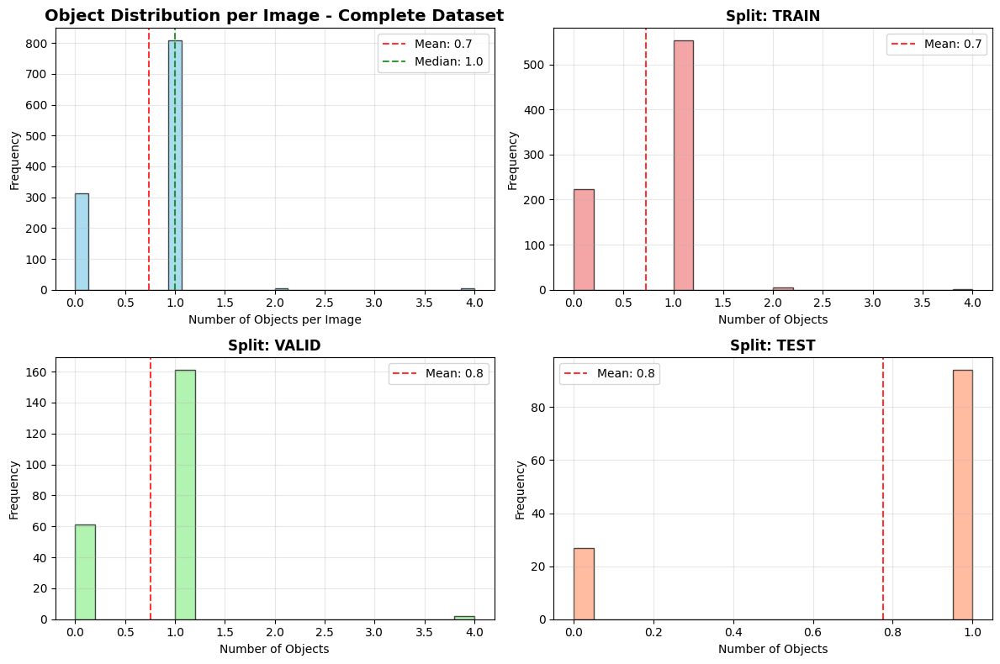

INFO: Creating box plot...
/tmp/ipykernel_15220/3325078014.py:200: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  box_plot = plt.boxplot(data_for_boxplot, labels=labels, patch_artist=True)
INFO: Plot saved to: analysis/objects_boxplot.png


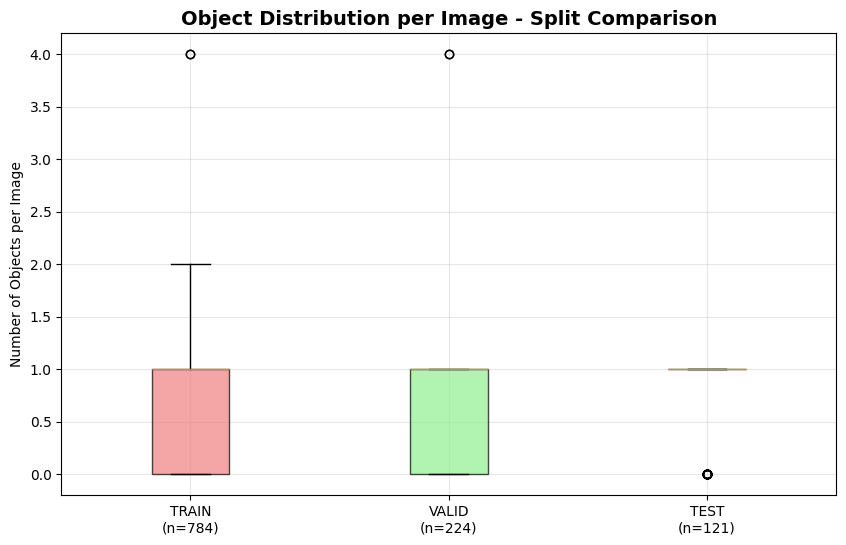

INFO: Creating comparative histogram...
INFO: Plot saved to: analysis/objects_comparison_histogram.png


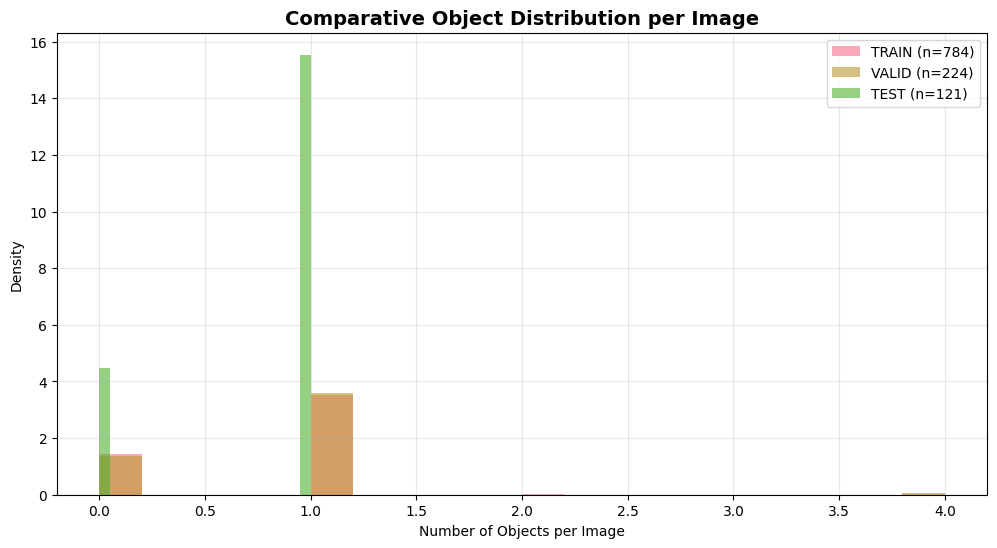

INFO: 
Analysis completed! Results saved in: analysis


In [ ]:
import os
import logging
import matplotlib.pyplot as plt
import numpy as np
from collections import defaultdict
import seaborn as sns
from pathlib import Path
from typing import Dict, List, Tuple, Optional
from dataclasses import dataclass

logging.basicConfig(level=logging.INFO, format="%(levelname)s: %(message)s")


@dataclass
class DatasetStatistics:
    """Container for dataset statistics."""
    total_images: int
    mean_objects: float
    median_objects: float
    std_objects: float
    min_objects: int
    max_objects: int
    percentiles: Dict[int, float]
    no_objects_count: int
    no_objects_percentage: float
    crowded_scenes_count: int
    crowded_scenes_percentage: float


class AnnotationFileProcessor:
    """Handles processing of annotation files to count objects."""
    
    @staticmethod
    def count_objects_in_file(annotation_path: Path) -> int:
        """Count the number of objects in a single annotation file."""
        try:
            with open(annotation_path, 'r') as f:
                lines = f.readlines()
            
            # Count non-empty lines (each line represents an object)
            object_count = len([line for line in lines if line.strip()])
            return object_count
            
        except Exception as e:
            logging.warning("Error reading %s: %s", annotation_path, e)
            return 0
    
    @staticmethod
    def process_split_directory(labels_path: Path) -> List[int]:
        """Process all annotation files in a split directory."""
        if not labels_path.exists():
            logging.warning("Labels directory not found: %s", labels_path)
            return []
        
        counts = []
        annotation_files = [f for f in os.listdir(labels_path) if f.endswith('.txt')]
        
        for annotation_file in annotation_files:
            annotation_path = labels_path / annotation_file
            object_count = AnnotationFileProcessor.count_objects_in_file(annotation_path)
            counts.append(object_count)
        
        return counts
    
    @staticmethod
    def count_objects_per_image(dataset_path: Path, splits: List[str]) -> Dict[str, List[int]]:
        """Count objects per image for each split in the dataset."""
        object_counts = {}
        
        for split in splits:
            labels_path = dataset_path / split / 'labels'
            counts = AnnotationFileProcessor.process_split_directory(labels_path)
            
            if counts:
                object_counts[split] = counts
                logging.info("Split '%s': %d images processed", split, len(counts))
            else:
                logging.warning("No valid data found for split '%s'", split)
        
        return object_counts


class StatisticsCalculator:
    """Calculates various statistics for object distribution analysis."""
    
    CROWDED_THRESHOLD = 10
    
    @staticmethod
    def calculate_basic_statistics(counts: List[int]) -> Dict[str, float]:
        """Calculate basic statistical measures."""
        if not counts:
            return {}
        
        return {
            'mean': np.mean(counts),
            'median': np.median(counts),
            'std': np.std(counts),
            'min': np.min(counts),
            'max': np.max(counts)
        }
    
    @staticmethod
    def calculate_percentiles(counts: List[int], percentiles: List[int] = [25, 50, 75, 90, 95, 99]) -> Dict[int, float]:
        """Calculate specified percentiles."""
        if not counts:
            return {}
        
        return dict(zip(percentiles, np.percentile(counts, percentiles)))
    
    @staticmethod
    def count_special_cases(counts: List[int]) -> Tuple[int, int]:
        """Count images with no objects and crowded scenes."""
        no_objects = sum(1 for count in counts if count == 0)
        crowded = sum(1 for count in counts if count > StatisticsCalculator.CROWDED_THRESHOLD)
        return no_objects, crowded
    
    @staticmethod
    def calculate_dataset_statistics(all_counts: List[int]) -> DatasetStatistics:
        """Calculate comprehensive statistics for the entire dataset."""
        if not all_counts:
            raise ValueError("No data provided for statistics calculation")
        
        basic_stats = StatisticsCalculator.calculate_basic_statistics(all_counts)
        percentiles = StatisticsCalculator.calculate_percentiles(all_counts)
        no_objects, crowded = StatisticsCalculator.count_special_cases(all_counts)
        
        total_images = len(all_counts)
        
        return DatasetStatistics(
            total_images=total_images,
            mean_objects=basic_stats['mean'],
            median_objects=basic_stats['median'],
            std_objects=basic_stats['std'],
            min_objects=int(basic_stats['min']),
            max_objects=int(basic_stats['max']),
            percentiles=percentiles,
            no_objects_count=no_objects,
            no_objects_percentage=(no_objects / total_images) * 100,
            crowded_scenes_count=crowded,
            crowded_scenes_percentage=(crowded / total_images) * 100
        )


class DistributionVisualizer:
    """Creates visualizations for object distribution analysis."""
    
    def __init__(self, save_path: Path):
        self.save_path = save_path
        self.save_path.mkdir(parents=True, exist_ok=True)
        
        # Configure plot style
        plt.style.use('default')
        sns.set_palette("husl")
    
    def create_comprehensive_histograms(self, object_counts: Dict[str, List[int]]) -> None:
        """Create comprehensive histogram visualization."""
        all_counts = self._combine_all_counts(object_counts)
        
        if not all_counts:
            logging.warning("No data available for histogram creation")
            return
        
        fig = plt.figure(figsize=(12, 8))
        
        # Main histogram for complete dataset
        self._plot_complete_dataset_histogram(plt.subplot(2, 2, 1), all_counts)
        
        # Individual split histograms
        self._plot_split_histograms(object_counts)
        
        plt.tight_layout()
        self._save_plot(fig, 'objects_per_image_histograms.png')
        plt.show()
    
    def create_comparative_histogram(self, object_counts: Dict[str, List[int]]) -> None:
        """Create comparative histogram showing all splits overlaid."""
        plt.figure(figsize=(12, 6))
        
        for split, counts in object_counts.items():
            if counts:
                plt.hist(counts, bins=20, alpha=0.6, 
                        label=f'{split.upper()} (n={len(counts)})', density=True)
        
        plt.title('Comparative Object Distribution per Image', fontsize=14, fontweight='bold')
        plt.xlabel('Number of Objects per Image')
        plt.ylabel('Density')
        plt.legend()
        plt.grid(True, alpha=0.3)
        
        self._save_plot(plt.gcf(), 'objects_comparison_histogram.png')
        plt.show()
    
    def create_box_plot(self, object_counts: Dict[str, List[int]]) -> None:
        """Create box plot for comparing distributions between splits."""
        plt.figure(figsize=(10, 6))
        
        data_for_boxplot, labels = self._prepare_boxplot_data(object_counts)
        
        if data_for_boxplot:
            box_plot = plt.boxplot(data_for_boxplot, labels=labels, patch_artist=True)
            self._style_boxplot(box_plot)
            
            plt.title('Object Distribution per Image - Split Comparison', 
                     fontsize=14, fontweight='bold')
            plt.ylabel('Number of Objects per Image')
            plt.grid(True, alpha=0.3)
            
            self._save_plot(plt.gcf(), 'objects_boxplot.png')
            plt.show()
    
    def _combine_all_counts(self, object_counts: Dict[str, List[int]]) -> List[int]:
        """Combine counts from all splits."""
        all_counts = []
        for split_counts in object_counts.values():
            all_counts.extend(split_counts)
        return all_counts
    
    def _plot_complete_dataset_histogram(self, ax, all_counts: List[int]) -> None:
        """Plot histogram for the complete dataset."""
        ax.hist(all_counts, bins=30, alpha=0.7, color='skyblue', edgecolor='black')
        ax.set_title('Object Distribution per Image - Complete Dataset', 
                    fontsize=14, fontweight='bold')
        ax.set_xlabel('Number of Objects per Image')
        ax.set_ylabel('Frequency')
        ax.grid(True, alpha=0.3)
        
        # Add statistical lines
        mean_objects = np.mean(all_counts)
        median_objects = np.median(all_counts)
        ax.axvline(mean_objects, color='red', linestyle='--', alpha=0.8, 
                  label=f'Mean: {mean_objects:.1f}')
        ax.axvline(median_objects, color='green', linestyle='--', alpha=0.8, 
                  label=f'Median: {median_objects:.1f}')
        ax.legend()
    
    def _plot_split_histograms(self, object_counts: Dict[str, List[int]]) -> None:
        """Plot individual histograms for each split."""
        colors = ['lightcoral', 'lightgreen', 'lightsalmon']
        positions = [(2, 2, 2), (2, 2, 3), (2, 2, 4)]
        
        for i, (split, counts) in enumerate(object_counts.items()):
            if i < 3 and counts:  # Maximum 3 splits
                ax = plt.subplot(*positions[i])
                ax.hist(counts, bins=20, alpha=0.7, color=colors[i], edgecolor='black')
                ax.set_title(f'Split: {split.upper()}', fontsize=12, fontweight='bold')
                ax.set_xlabel('Number of Objects')
                ax.set_ylabel('Frequency')
                ax.grid(True, alpha=0.3)
                
                # Add mean line
                if counts:
                    split_mean = np.mean(counts)
                    ax.axvline(split_mean, color='red', linestyle='--', alpha=0.8, 
                              label=f'Mean: {split_mean:.1f}')
                    ax.legend()
    
    def _prepare_boxplot_data(self, object_counts: Dict[str, List[int]]) -> Tuple[List[List[int]], List[str]]:
        """Prepare data for box plot visualization."""
        data_for_boxplot = []
        labels = []
        
        for split, counts in object_counts.items():
            if counts:
                data_for_boxplot.append(counts)
                labels.append(f"{split.upper()}\n(n={len(counts)})")
        
        return data_for_boxplot, labels
    
    def _style_boxplot(self, box_plot) -> None:
        """Apply styling to box plot."""
        colors = ['lightcoral', 'lightgreen', 'lightsalmon', 'lightblue']
        for patch, color in zip(box_plot['boxes'], colors):
            patch.set_facecolor(color)
            patch.set_alpha(0.7)
    
    def _save_plot(self, fig, filename: str) -> None:
        """Save plot to file."""
        file_path = self.save_path / filename
        fig.savefig(file_path, dpi=300, bbox_inches='tight')
        logging.info("Plot saved to: %s", file_path)


class StatisticsReporter:
    """Handles reporting of statistics in a formatted way."""
    
    @staticmethod
    def print_comprehensive_statistics(object_counts: Dict[str, List[int]]) -> None:
        """Print comprehensive statistics report."""
        logging.info("\n" + "="*60)
        logging.info("DETAILED OBJECT DISTRIBUTION STATISTICS")
        logging.info("="*60)
        
        all_counts = []
        for split_counts in object_counts.values():
            all_counts.extend(split_counts)
        
        if all_counts:
            StatisticsReporter._print_dataset_statistics(all_counts)
            StatisticsReporter._print_split_statistics(object_counts)
    
    @staticmethod
    def _print_dataset_statistics(all_counts: List[int]) -> None:
        """Print statistics for the complete dataset."""
        stats = StatisticsCalculator.calculate_dataset_statistics(all_counts)
        
        logging.info("\nCOMPLETE DATASET:")
        logging.info("   Total images: %d", stats.total_images)
        logging.info("   Mean objects per image: %.2f", stats.mean_objects)
        logging.info("   Median: %.2f", stats.median_objects)
        logging.info("   Standard deviation: %.2f", stats.std_objects)
        logging.info("   Min-Max: %d-%d objects", stats.min_objects, stats.max_objects)
        logging.info("   Percentiles: %s", stats.percentiles)
        logging.info("   Images without objects: %d (%.1f%%)", 
                    stats.no_objects_count, stats.no_objects_percentage)
        logging.info("   Images with >10 objects: %d (%.1f%%)", 
                    stats.crowded_scenes_count, stats.crowded_scenes_percentage)
    
    @staticmethod
    def _print_split_statistics(object_counts: Dict[str, List[int]]) -> None:
        """Print statistics for each split."""
        for split, counts in object_counts.items():
            if counts:
                basic_stats = StatisticsCalculator.calculate_basic_statistics(counts)
                no_objects, crowded = StatisticsCalculator.count_special_cases(counts)
                
                logging.info("\nSPLIT '%s':", split.upper())
                logging.info("   Number of images: %d", len(counts))
                logging.info("   Mean: %.2f", basic_stats['mean'])
                logging.info("   Median: %.2f", basic_stats['median'])
                logging.info("   Standard deviation: %.2f", basic_stats['std'])
                logging.info("   Min-Max: %d-%d", int(basic_stats['min']), int(basic_stats['max']))
                logging.info("   Without objects: %d (%.1f%%)", 
                           no_objects, (no_objects/len(counts))*100)
                logging.info("   Dense scenes (>10 obj): %d (%.1f%%)", 
                           crowded, (crowded/len(counts))*100)


class ObjectDistributionAnalyzer:
    """Main class for analyzing object distribution in datasets."""
    
    def __init__(self, dataset_path: str, save_path: str = './object_distribution_analysis'):
        self.dataset_path = Path(dataset_path)
        self.save_path = Path(save_path)
        self.visualizer = DistributionVisualizer(self.save_path)
    
    def analyze(self, splits: List[str] = ['train', 'valid', 'test']) -> Dict[str, List[int]]:
        """Run complete object distribution analysis."""
        logging.info("Starting object distribution analysis...")
        
        # Count objects per image
        object_counts = AnnotationFileProcessor.count_objects_per_image(
            self.dataset_path, splits)
        
        if not any(object_counts.values()):
            logging.error("No data found. Please check the dataset path.")
            return {}
        
        # Generate statistics report
        StatisticsReporter.print_comprehensive_statistics(object_counts)
        
        # Create visualizations
        self._create_all_visualizations(object_counts)
        
        logging.info("\nAnalysis completed! Results saved in: %s", self.save_path)
        return object_counts
    
    def _create_all_visualizations(self, object_counts: Dict[str, List[int]]) -> None:
        """Create all visualization plots."""
        logging.info("\nCreating histograms...")
        self.visualizer.create_comprehensive_histograms(object_counts)
        
        logging.info("Creating box plot...")
        self.visualizer.create_box_plot(object_counts)
        
        logging.info("Creating comparative histogram...")
        self.visualizer.create_comparative_histogram(object_counts)


try:
    dataset_path = "./data"    
    analyzer = ObjectDistributionAnalyzer(
        dataset_path=dataset_path,
        save_path='./analysis'
    )
    
    results = analyzer.analyze(splits=['train', 'valid', 'test'])
    
except Exception as e:
    logging.error("Error during analysis: %s", e)

INFO: Dataset: data
INFO: Splits found: ['train', 'valid', 'test']
INFO: Starting negative sample analysis...
INFO: Searching for images without objects...
INFO: Split 'train': 224 images without objects
INFO: Split 'valid': 61 images without objects
INFO: Split 'test': 27 images without objects
INFO: 
SUMMARY:
INFO: ------------------------------
INFO: TRAIN: 224 images without objects
INFO: VALID: 61 images without objects
INFO: TEST: 27 images without objects
INFO: TOTAL: 312 images without objects
INFO: 
Creating charts...
INFO: Charts saved to: analysis/negative_samples_charts.png


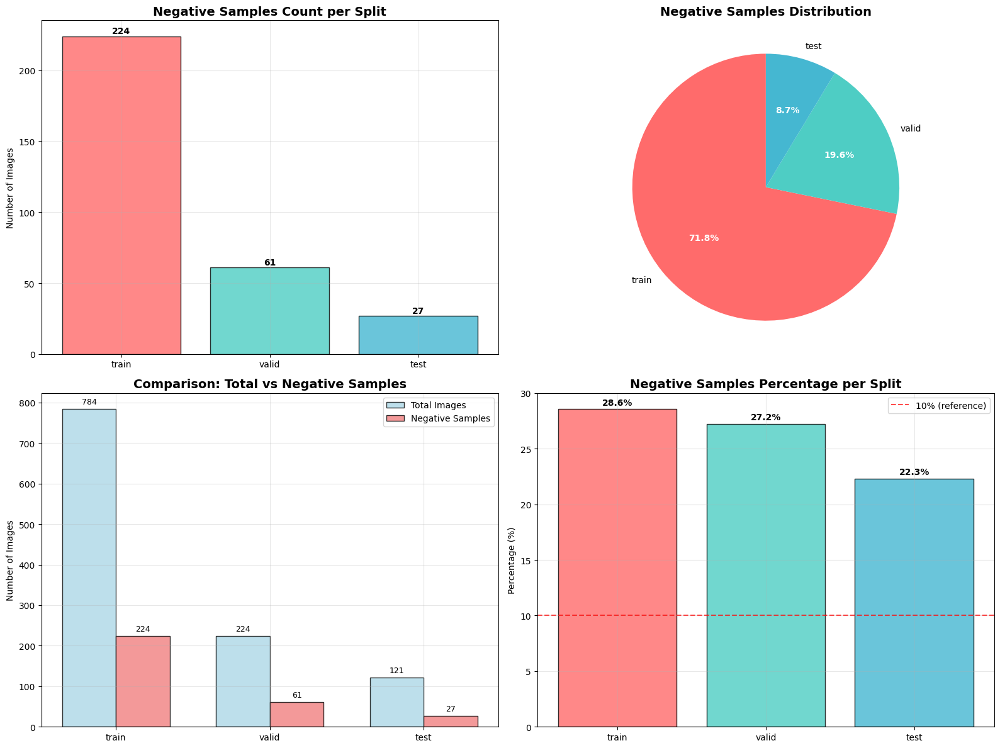

INFO: Plotting example images...
INFO: Example images saved to: analysis/negative_samples_examples.png


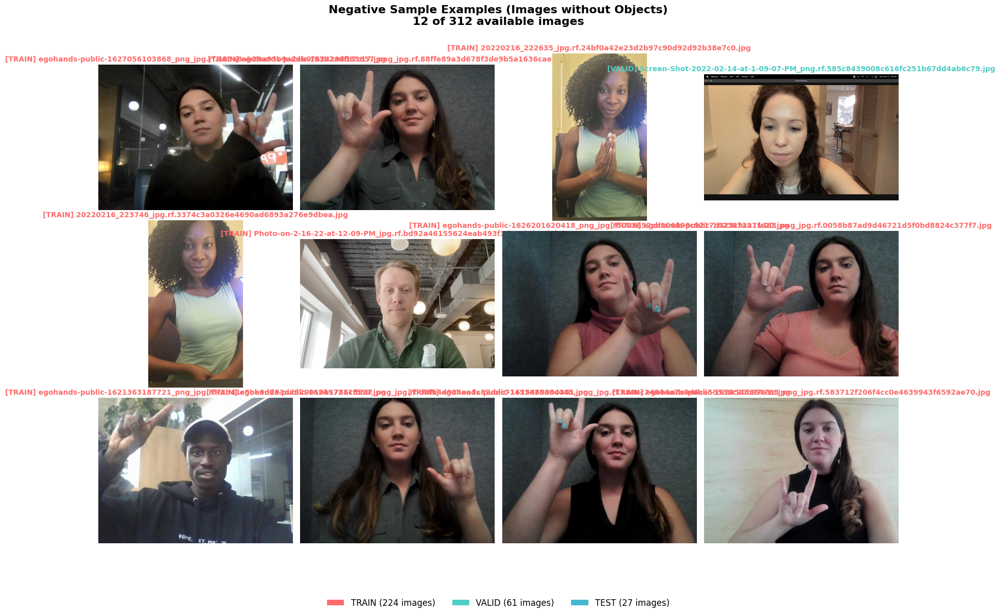

INFO: Split file saved: analysis/images_without_objects_train.txt (224 images)
INFO: Split file saved: analysis/images_without_objects_valid.txt (61 images)
INFO: Split file saved: analysis/images_without_objects_test.txt (27 images)
INFO: Report saved to: analysis/negative_samples_report.txt
INFO: Analysis completed!
INFO: Generated files:
INFO:    - Charts: ./analysis/negative_samples_charts.png
INFO:    - Examples: ./analysis/negative_samples_examples.png
INFO:    - Split files: ./analysis/images_without_objects_*.txt
INFO:    - Report: ./analysis/negative_samples_report.txt


In [4]:
import os
import logging
from pathlib import Path
import yaml
from datetime import datetime
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import random
import seaborn as sns
from typing import Dict, List, Tuple, Optional
from dataclasses import dataclass

logging.basicConfig(level=logging.INFO, format="%(levelname)s: %(message)s")


@dataclass
class NegativeSampleData:
    """Container for negative sample information."""
    split: str
    image_path: str
    full_path: str
    label_file: str


class ImageFinder:
    """Handles finding and validating image files."""
    
    SUPPORTED_EXTENSIONS = ['.jpg', '.jpeg', '.png', '.bmp', '.tiff', '.webp']
    
    @staticmethod
    def find_corresponding_image(label_file: Path, images_path: Path) -> Optional[Path]:
        """Find the image file corresponding to a label file."""
        image_name = label_file.stem
        
        for ext in ImageFinder.SUPPORTED_EXTENSIONS:
            potential_image = images_path / f"{image_name}{ext}"
            if potential_image.exists():
                return potential_image
        
        return None
    
    @staticmethod
    def count_images_in_directory(images_path: Path) -> int:
        """Count total number of images in a directory."""
        if not images_path.exists():
            return 0
        
        total_images = 0
        for ext in ImageFinder.SUPPORTED_EXTENSIONS:
            total_images += len(list(images_path.glob(f'*{ext}')))
        
        return total_images


class LabelFileProcessor:
    """Handles processing of label files to detect empty annotations."""
    
    @staticmethod
    def is_label_file_empty(label_file: Path) -> bool:
        """Check if a label file is empty or contains only empty lines."""
        try:
            with open(label_file, 'r') as f:
                content = f.read().strip()
            
            return not content or all(line.strip() == '' for line in content.split('\n'))
            
        except Exception as e:
            logging.warning("Error reading %s: %s", label_file, e)
            return False


class NegativeSampleFinder:
    """Finds images without any annotated objects."""
    
    def __init__(self, dataset_path: str):
        self.dataset_path = Path(dataset_path)
    
    def find_images_without_objects(self, splits: List[str] = ['train', 'valid', 'test']) -> Tuple[Dict[str, List[str]], List[NegativeSampleData]]:
        """Find all images that have no annotated objects."""
        images_without_objects = {}
        all_empty_images = []
        
        logging.info("Searching for images without objects...")
        
        for split in splits:
            empty_images = self._process_split(split)
            images_without_objects[split] = [img.image_path for img in empty_images]
            all_empty_images.extend(empty_images)
            
            logging.info("Split '%s': %d images without objects", split, len(empty_images))
        
        return images_without_objects, all_empty_images
    
    def _process_split(self, split: str) -> List[NegativeSampleData]:
        """Process a single split to find empty images."""
        labels_path = self.dataset_path / split / 'labels'
        images_path = self.dataset_path / split / 'images'
        
        if not self._validate_split_directories(labels_path, images_path, split):
            return []
        
        empty_images = []
        label_files = list(labels_path.glob('*.txt'))
        
        for label_file in label_files:
            if LabelFileProcessor.is_label_file_empty(label_file):
                image_path = self._find_and_process_empty_image(label_file, images_path, split)
                if image_path:
                    empty_images.append(image_path)
        
        return empty_images
    
    def _validate_split_directories(self, labels_path: Path, images_path: Path, split: str) -> bool:
        """Validate that both labels and images directories exist."""
        if not labels_path.exists():
            logging.warning("Labels directory not found: %s", labels_path)
            return False
        
        if not images_path.exists():
            logging.warning("Images directory not found: %s", images_path)
            return False
        
        return True
    
    def _find_and_process_empty_image(self, label_file: Path, images_path: Path, split: str) -> Optional[NegativeSampleData]:
        """Find and process an image corresponding to an empty label file."""
        found_image = ImageFinder.find_corresponding_image(label_file, images_path)
        
        if found_image:
            relative_path = found_image.relative_to(self.dataset_path)
            return NegativeSampleData(
                split=split,
                image_path=str(relative_path),
                full_path=str(found_image),
                label_file=str(label_file.relative_to(self.dataset_path))
            )
        else:
            logging.warning("Image not found for: %s", label_file.name)
            return None


class NegativeSampleVisualizer:
    """Creates visualizations for negative sample analysis."""
    
    def __init__(self, output_dir: str = './analysis'):
        self.output_dir = Path(output_dir)
        self.output_dir.mkdir(parents=True, exist_ok=True)
        
        # Configure plot style
        plt.style.use('default')
        sns.set_palette("husl")
        self.colors = ['#FF6B6B', '#4ECDC4', '#45B7D1', '#96CEB4']
    
    def create_negative_samples_charts(self, images_without_objects: Dict[str, List[str]], dataset_path: str) -> Path:
        """Create comprehensive charts for negative samples analysis."""
        split_totals, split_empty = self._calculate_split_statistics(images_without_objects, dataset_path)
        
        fig, axes = plt.subplots(2, 2, figsize=(16, 12))
        
        self._plot_absolute_counts(axes[0, 0], split_empty)
        self._plot_percentage_distribution(axes[0, 1], split_empty)
        self._plot_total_vs_negative_comparison(axes[1, 0], split_totals, split_empty)
        self._plot_percentage_by_split(axes[1, 1], split_totals, split_empty)
        
        plt.tight_layout()
        
        chart_path = self.output_dir / 'negative_samples_charts.png'
        plt.savefig(chart_path, dpi=300, bbox_inches='tight', facecolor='white')
        logging.info("Charts saved to: %s", chart_path)
        plt.show()
        
        return chart_path
    
    def plot_negative_samples_examples(self, all_empty_images: List[NegativeSampleData], 
                                     dataset_path: str, max_images: int = 12) -> Optional[Path]:
        """Plot examples of negative sample images."""
        if not all_empty_images:
            logging.warning("No negative sample images found to plot.")
            return None
        
        selected_images = self._select_random_images(all_empty_images, max_images)
        fig, axes = self._setup_image_grid(selected_images)
        
        self._plot_selected_images(axes, selected_images, dataset_path)
        self._configure_image_plot_layout(fig, selected_images, all_empty_images)
        
        images_path = self.output_dir / 'negative_samples_examples.png'
        plt.savefig(images_path, dpi=300, bbox_inches='tight', facecolor='white')
        logging.info("Example images saved to: %s", images_path)
        plt.show()
        
        return images_path
    
    def _calculate_split_statistics(self, images_without_objects: Dict[str, List[str]], 
                                  dataset_path: str) -> Tuple[Dict[str, int], Dict[str, int]]:
        """Calculate statistics for each split."""
        split_totals = {}
        split_empty = {}
        
        for split in images_without_objects.keys():
            images_path = Path(dataset_path) / split / 'images'
            total_images = ImageFinder.count_images_in_directory(images_path)
            
            split_totals[split] = total_images
            split_empty[split] = len(images_without_objects[split])
        
        return split_totals, split_empty
    
    def _plot_absolute_counts(self, ax, split_empty: Dict[str, int]) -> None:
        """Plot absolute counts of negative samples per split."""
        splits = list(split_empty.keys())
        empty_counts = list(split_empty.values())
        
        bars = ax.bar(splits, empty_counts, color=self.colors[:len(splits)], 
                     alpha=0.8, edgecolor='black')
        ax.set_title('Negative Samples Count per Split', fontsize=14, fontweight='bold')
        ax.set_ylabel('Number of Images')
        ax.grid(True, alpha=0.3)
        
        # Add value labels on bars
        for bar, count in zip(bars, empty_counts):
            height = bar.get_height()
            ax.text(bar.get_x() + bar.get_width()/2., height + 0.5,
                   f'{count}', ha='center', va='bottom', fontweight='bold')
    
    def _plot_percentage_distribution(self, ax, split_empty: Dict[str, int]) -> None:
        """Plot percentage distribution of negative samples."""
        splits = list(split_empty.keys())
        empty_counts = list(split_empty.values())
        
        if sum(empty_counts) > 0:
            wedges, texts, autotexts = ax.pie(empty_counts, labels=splits, autopct='%1.1f%%', 
                                            colors=self.colors[:len(splits)], startangle=90)
            ax.set_title('Negative Samples Distribution', fontsize=14, fontweight='bold')
            
            for autotext in autotexts:
                autotext.set_color('white')
                autotext.set_fontweight('bold')
        else:
            ax.text(0.5, 0.5, 'No\nNegative Samples\nFound', 
                   ha='center', va='center', transform=ax.transAxes, fontsize=12)
            ax.set_title('Negative Samples Distribution', fontsize=14, fontweight='bold')
    
    def _plot_total_vs_negative_comparison(self, ax, split_totals: Dict[str, int], 
                                         split_empty: Dict[str, int]) -> None:
        """Plot comparison between total images and negative samples."""
        splits = list(split_empty.keys())
        x_pos = np.arange(len(splits))
        width = 0.35
        
        total_counts = [split_totals.get(split, 0) for split in splits]
        empty_counts = [split_empty.get(split, 0) for split in splits]
        
        bars1 = ax.bar(x_pos - width/2, total_counts, width, label='Total Images', 
                      color='lightblue', alpha=0.8, edgecolor='black')
        bars2 = ax.bar(x_pos + width/2, empty_counts, width, label='Negative Samples', 
                      color='lightcoral', alpha=0.8, edgecolor='black')
        
        ax.set_title('Comparison: Total vs Negative Samples', fontsize=14, fontweight='bold')
        ax.set_ylabel('Number of Images')
        ax.set_xticks(x_pos)
        ax.set_xticklabels(splits)
        ax.legend()
        ax.grid(True, alpha=0.3)
        
        # Add value labels
        for bars in [bars1, bars2]:
            for bar in bars:
                height = bar.get_height()
                if height > 0:
                    ax.text(bar.get_x() + bar.get_width()/2., height + max(total_counts) * 0.01,
                           f'{int(height)}', ha='center', va='bottom', fontsize=9)
    
    def _plot_percentage_by_split(self, ax, split_totals: Dict[str, int], 
                                split_empty: Dict[str, int]) -> None:
        """Plot percentage of negative samples by split."""
        splits = list(split_empty.keys())
        percentages = []
        
        for split in splits:
            total = split_totals.get(split, 0)
            empty = split_empty.get(split, 0)
            pct = (empty / total * 100) if total > 0 else 0
            percentages.append(pct)
        
        bars = ax.bar(splits, percentages, color=self.colors[:len(splits)], 
                     alpha=0.8, edgecolor='black')
        ax.set_title('Negative Samples Percentage per Split', fontsize=14, fontweight='bold')
        ax.set_ylabel('Percentage (%)')
        ax.grid(True, alpha=0.3)
        
        # Add value labels
        for bar, pct in zip(bars, percentages):
            height = bar.get_height()
            ax.text(bar.get_x() + bar.get_width()/2., height + 0.2,
                   f'{pct:.1f}%', ha='center', va='bottom', fontweight='bold')
        
        # Add reference line (10%)
        ax.axhline(y=10, color='red', linestyle='--', alpha=0.7, label='10% (reference)')
        ax.legend()
    
    def _select_random_images(self, all_empty_images: List[NegativeSampleData], 
                            max_images: int) -> List[NegativeSampleData]:
        """Select random images for visualization."""
        return random.sample(all_empty_images, min(max_images, len(all_empty_images)))
    
    def _setup_image_grid(self, selected_images: List[NegativeSampleData]) -> Tuple[plt.Figure, np.ndarray]:
        """Setup the grid for displaying images."""
        cols = min(4, len(selected_images))
        rows = (len(selected_images) + cols - 1) // cols
        
        fig, axes = plt.subplots(rows, cols, figsize=(16, 4*rows))
        
        # Normalize axes array
        if rows == 1 and cols == 1:
            axes = [axes]
        elif rows == 1 or cols == 1:
            axes = axes.flatten()
        else:
            axes = axes.flatten()
        
        return fig, axes
    
    def _plot_selected_images(self, axes, selected_images: List[NegativeSampleData], 
                            dataset_path: str) -> None:
        """Plot the selected images on the axes."""
        split_colors = {
            'train': '#FF6B6B',
            'valid': '#4ECDC4', 
            'test': '#45B7D1'
        }
        
        for i, img_info in enumerate(selected_images):
            ax = axes[i]
            
            try:
                img_path = Path(dataset_path) / img_info.image_path
                image = Image.open(img_path).convert('RGB')
                
                ax.imshow(image)
                ax.axis('off')
                
                # Add title and styling
                split = img_info.split
                filename = Path(img_info.image_path).name
                color = split_colors.get(split, '#666666')
                
                ax.set_title(f"[{split.upper()}] {filename}", 
                           fontsize=10, pad=5, color=color, fontweight='bold')
                
                # Add colored border
                for spine in ax.spines.values():
                    spine.set_edgecolor(color)
                    spine.set_linewidth(3)
                    spine.set_visible(True)
                    
            except Exception as e:
                ax.text(0.5, 0.5, f'Error loading\n{img_info.image_path}\n{str(e)}', 
                       ha='center', va='center', transform=ax.transAxes, 
                       bbox=dict(boxstyle="round,pad=0.3", facecolor='lightcoral', alpha=0.7))
                ax.axis('off')
        
        # Turn off empty axes
        for i in range(len(selected_images), len(axes)):
            axes[i].axis('off')
    
    def _configure_image_plot_layout(self, fig, selected_images: List[NegativeSampleData], 
                                   all_empty_images: List[NegativeSampleData]) -> None:
        """Configure the layout of the image plot."""
        plt.suptitle(f'Negative Sample Examples (Images without Objects)\n'
                     f'{len(selected_images)} of {len(all_empty_images)} available images', 
                     fontsize=16, fontweight='bold', y=0.98)
        
        # Create legend
        split_colors = {'train': '#FF6B6B', 'valid': '#4ECDC4', 'test': '#45B7D1'}
        legend_elements = []
        
        for split, color in split_colors.items():
            count = sum(1 for img in all_empty_images if img.split == split)
            if count > 0:
                legend_elements.append(plt.Rectangle((0,0),1,1, facecolor=color, 
                                                   label=f'{split.upper()} ({count} images)'))
        
        if legend_elements:
            fig.legend(handles=legend_elements, loc='lower center', 
                      bbox_to_anchor=(0.5, -0.02), ncol=len(legend_elements), 
                      frameon=False, fontsize=12)
        
        plt.tight_layout()
        plt.subplots_adjust(top=0.90, bottom=0.08)


class NegativeSampleReporter:
    """Creates reports and saves lists of negative samples."""
    
    def __init__(self, output_dir: str = './analysis'):
        self.output_dir = Path(output_dir)
        self.output_dir.mkdir(parents=True, exist_ok=True)
    
    def save_split_files(self, all_empty_images: List[NegativeSampleData]) -> List[Path]:
        """Save separate files for each split containing only filenames."""
        saved_files = []
        
        # Group images by split
        split_images = {}
        for img_data in all_empty_images:
            split = img_data.split
            if split not in split_images:
                split_images[split] = []
            
            # Extract just the filename from the full path
            filename = Path(img_data.image_path).name
            split_images[split].append(filename)
        
        # Create a file for each split
        for split, filenames in split_images.items():
            if filenames:  # Only create file if there are images
                output_path = self.output_dir / f'images_without_objects_{split}.txt'
                
                with open(output_path, 'w', encoding='utf-8') as f:
                    for filename in sorted(filenames):  # Sort for consistency
                        f.write(f"{filename}\n")
                
                logging.info("Split file saved: %s (%d images)", output_path, len(filenames))
                saved_files.append(output_path)
        
        return saved_files
    
    def create_summary_report(self, images_without_objects: Dict[str, List[str]], 
                            all_empty_images: List[NegativeSampleData], 
                            dataset_path: str) -> Path:
        """Create a summary report about negative samples."""
        split_totals = self._calculate_split_totals(images_without_objects, dataset_path)
        report_path = self.output_dir / 'negative_samples_report.txt'
        
        with open(report_path, 'w', encoding='utf-8') as f:
            self._write_report_header(f)
            self._write_split_statistics(f, images_without_objects, split_totals)
            self._write_general_statistics(f, images_without_objects, split_totals)
        
        logging.info("Report saved to: %s", report_path)
        return report_path
    
    def _calculate_split_totals(self, images_without_objects: Dict[str, List[str]], 
                              dataset_path: str) -> Dict[str, int]:
        """Calculate total images per split."""
        split_totals = {}
        
        for split in images_without_objects.keys():
            images_path = Path(dataset_path) / split / 'images'
            split_totals[split] = ImageFinder.count_images_in_directory(images_path)
        
        return split_totals
    
    def _write_report_header(self, f) -> None:
        """Write header for the summary report."""
        f.write("NEGATIVE SAMPLES REPORT\n")
        f.write("="*50 + "\n\n")
    
    def _write_split_statistics(self, f, images_without_objects: Dict[str, List[str]], 
                              split_totals: Dict[str, int]) -> None:
        """Write statistics by split."""
        f.write("STATISTICS BY SPLIT:\n")
        f.write("-" * 30 + "\n")
        
        total_dataset_images = 0
        total_empty_images = 0
        
        for split, empty_images in images_without_objects.items():
            split_total = split_totals.get(split, 0)
            empty_count = len(empty_images)
            percentage = (empty_count / split_total * 100) if split_total > 0 else 0
            
            f.write(f"\n{split.upper()}:\n")
            f.write(f"  Total images: {split_total}\n")
            f.write(f"  Images without objects: {empty_count}\n")
            f.write(f"  Percentage: {percentage:.2f}%\n")
            
            total_dataset_images += split_total
            total_empty_images += empty_count
        
        return total_dataset_images, total_empty_images
    
    def _write_general_statistics(self, f, images_without_objects: Dict[str, List[str]], 
                                split_totals: Dict[str, int]) -> None:
        """Write general statistics."""
        total_dataset_images, total_empty_images = self._write_split_statistics(
            f, images_without_objects, split_totals)
        
        overall_percentage = (total_empty_images / total_dataset_images * 100) if total_dataset_images > 0 else 0
        
        f.write(f"\nGENERAL STATISTICS:\n")
        f.write("-" * 30 + "\n")
        f.write(f"Total images in dataset: {total_dataset_images}\n")
        f.write(f"Total images without objects: {total_empty_images}\n")
        f.write(f"Overall percentage: {overall_percentage:.2f}%\n")


class NegativeSampleAnalyzer:
    """Main class for analyzing negative samples in datasets."""
    
    def __init__(self, dataset_path: str = './data', output_dir: str = './analysis'):
        self.dataset_path = dataset_path
        self.output_dir = output_dir
        self.finder = NegativeSampleFinder(dataset_path)
        self.visualizer = NegativeSampleVisualizer(output_dir)
        self.reporter = NegativeSampleReporter(output_dir)
    
    def analyze(self, splits: List[str] = ['train', 'valid', 'test']) -> Tuple[Dict[str, List[str]], List[NegativeSampleData]]:
        """Run complete negative sample analysis."""
        logging.info("Starting negative sample analysis...")
        
        if not self._validate_dataset_path():
            return {}, []
        
        # Find images without objects
        images_without_objects, all_empty_images = self.finder.find_images_without_objects(splits)
        
        if not all_empty_images:
            logging.info("No images without objects found!")
            return images_without_objects, all_empty_images
        
        self._log_summary(images_without_objects, all_empty_images)
        self._create_visualizations(images_without_objects, all_empty_images)
        self._generate_reports(images_without_objects, all_empty_images)
        
        logging.info("Analysis completed!")
        self._log_generated_files()
        
        return images_without_objects, all_empty_images
    
    def analyze_from_yaml(self, yaml_path: str = './data/data.yaml') -> Tuple[Dict[str, List[str]], List[NegativeSampleData]]:
        """Execute analysis using YAML configuration file."""
        yaml_file = Path(yaml_path)
        
        if not yaml_file.exists():
            logging.error("YAML file not found: %s", yaml_path)
            return {}, []
        
        config = self._load_yaml_config(yaml_file)
        dataset_path = yaml_file.parent
        splits = self._extract_splits_from_config(config)
        
        logging.info("Dataset: %s", dataset_path)
        logging.info("Splits found: %s", splits)
        
        # Update analyzer with new dataset path
        self.finder = NegativeSampleFinder(str(dataset_path))
        
        return self.analyze(splits)
    
    def _validate_dataset_path(self) -> bool:
        """Validate that the dataset path exists."""
        if not Path(self.dataset_path).exists():
            logging.error("Dataset not found at: %s", self.dataset_path)
            return False
        return True
    
    def _log_summary(self, images_without_objects: Dict[str, List[str]], 
                    all_empty_images: List[NegativeSampleData]) -> None:
        """Log summary of findings."""
        logging.info("\nSUMMARY:")
        logging.info("-" * 30)
        for split, images in images_without_objects.items():
            logging.info("%s: %d images without objects", split.upper(), len(images))
        logging.info("TOTAL: %d images without objects", len(all_empty_images))
    
    def _create_visualizations(self, images_without_objects: Dict[str, List[str]], 
                             all_empty_images: List[NegativeSampleData]) -> None:
        """Create all visualizations."""
        logging.info("\nCreating charts...")
        self.visualizer.create_negative_samples_charts(images_without_objects, self.dataset_path)
        
        logging.info("Plotting example images...")
        self.visualizer.plot_negative_samples_examples(all_empty_images, self.dataset_path, max_images=12)
    
    def _generate_reports(self, images_without_objects: Dict[str, List[str]], 
                         all_empty_images: List[NegativeSampleData]) -> None:
        """Generate all reports."""
        # Generate separate files for each split with filenames only
        self.reporter.save_split_files(all_empty_images)
        
        # Generate summary report
        self.reporter.create_summary_report(images_without_objects, all_empty_images, self.dataset_path)
    
    def _log_generated_files(self) -> None:
        """Log information about generated files."""
        logging.info("Generated files:")
        logging.info("   - Charts: %s/negative_samples_charts.png", self.output_dir)
        logging.info("   - Examples: %s/negative_samples_examples.png", self.output_dir)
        logging.info("   - Split files: %s/images_without_objects_*.txt", self.output_dir)
        logging.info("   - Report: %s/negative_samples_report.txt", self.output_dir)
    
    def _load_yaml_config(self, yaml_file: Path) -> dict:
        """Load YAML configuration file."""
        with open(yaml_file, 'r') as f:
            return yaml.safe_load(f)
    
    def _extract_splits_from_config(self, config: dict) -> List[str]:
        """Extract splits from configuration."""
        splits = []
        for key in ['train', 'val', 'test']:
            if key in config:
                splits.append('valid' if key == 'val' else key)
        return splits


try:
    analyzer = NegativeSampleAnalyzer(
        dataset_path='./data',
        output_dir='./analysis'
    )

    results = analyzer.analyze_from_yaml('./data/data.yaml')
    
except Exception as e:
    logging.error("Error during analysis: %s", e)

INFO: Starting bounding box size and proportion analysis...
INFO: Extracting bounding box dimensions...
INFO: Split 'train': 571 bounding boxes
INFO: Split 'valid': 169 bounding boxes
INFO: Split 'test': 94 bounding boxes
INFO: 
Creating analysis plots...
/tmp/ipykernel_15220/459528779.py:328: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  box_plot = plt.boxplot(area_data, labels=splits, patch_artist=True)
INFO: Main plot saved to: analysis/bbox_size_analysis.png


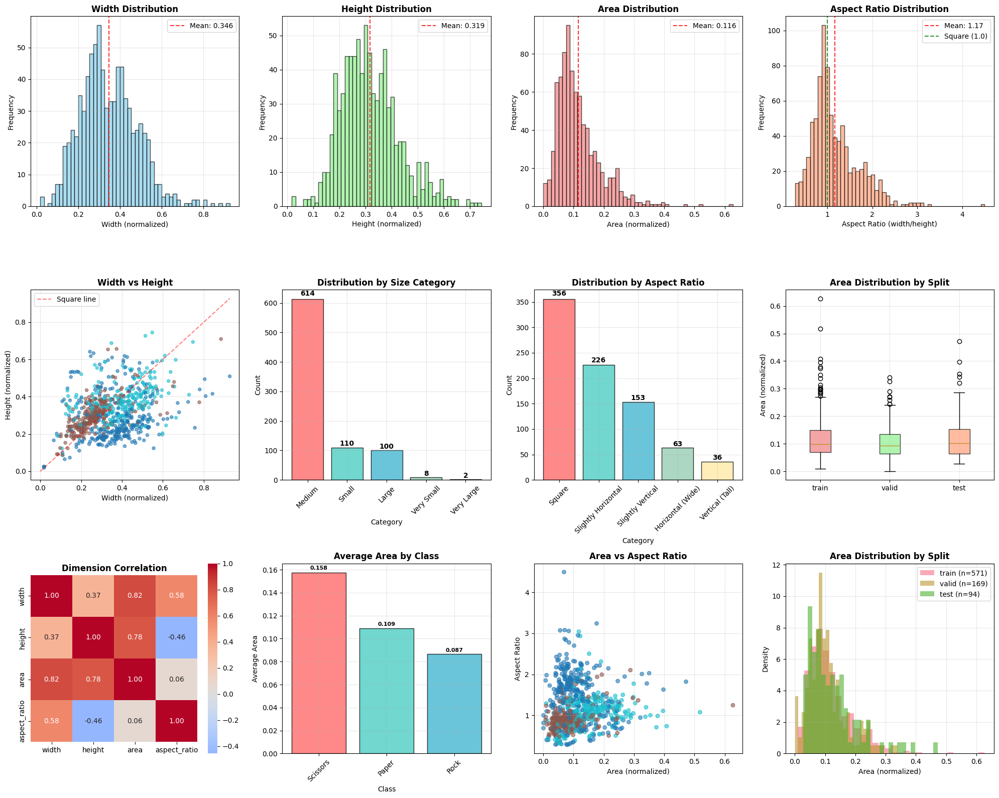

INFO: Creating detailed scatter plots...
INFO: Scatter plots saved to: analysis/bbox_scatter_plots.png


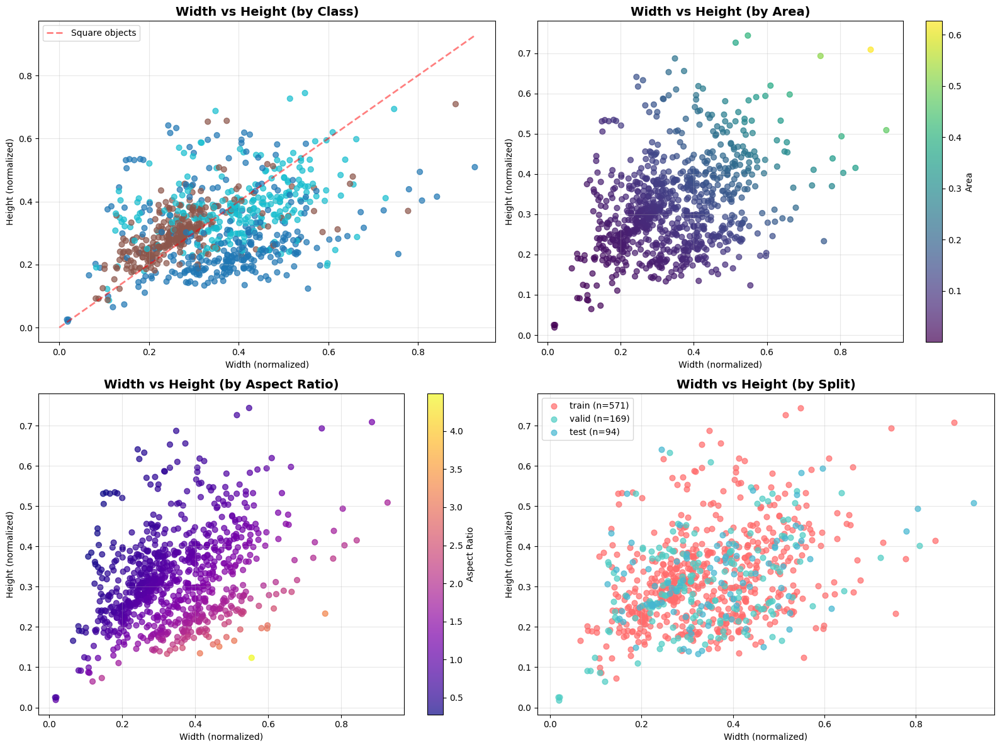

INFO: 
INFO: DETAILED BOUNDING BOX SIZE AND PROPORTION ANALYSIS
INFO: ================================================================================
INFO: 
GENERAL STATISTICS:
INFO:    Total bounding boxes: 834
INFO:    Average width: 0.3460 ± 0.1350
INFO:    Average height: 0.3186 ± 0.1124
INFO:    Average area: 0.1158 ± 0.0732
INFO:    Average aspect ratio: 1.17 ± 0.52
INFO: 
PERCENTILES:
INFO:    Width: {5: np.float64(0.14529947916666666), 25: np.float64(0.2519094831825335), 50: np.float64(0.3278995118845501), 75: np.float64(0.4328125), 95: np.float64(0.5599489583333332)}
INFO:    Height: {5: np.float64(0.16638621794871794), 25: np.float64(0.23793182961596512), 50: np.float64(0.30416666666666664), 75: np.float64(0.38132194510035416), 95: np.float64(0.5328265625)}
INFO:    Area: {5: np.float64(0.03341567804783951), 25: np.float64(0.06758138020833333), 50: np.float64(0.09649710188348784), 75: np.float64(0.14872130547417534), 95: np.float64(0.24846630859375002)}
INFO: 
SIZE DISTRIBUT

In [5]:
import os
import logging
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import yaml
from collections import defaultdict
import pandas as pd
from typing import Dict, List, Tuple, Optional
from dataclasses import dataclass

logging.basicConfig(level=logging.INFO, format="%(levelname)s: %(message)s")


@dataclass
class BoundingBoxData:
    """Container for bounding box information."""
    split: str
    class_id: int
    width: float
    height: float
    area: float
    aspect_ratio: float
    file: str


class BoundingBoxProcessor:
    """Handles reading and processing YOLO label files."""
    
    @staticmethod
    def read_yolo_labels(label_path: Path) -> List[Tuple[int, float, float, float, float]]:
        """Read YOLO label file and return list of bounding boxes."""
        boxes = []
        try:
            with open(label_path, 'r') as f:
                for line in f:
                    line = line.strip()
                    if line:
                        parts = line.split()
                        if len(parts) >= 5:
                            class_id = int(parts[0])
                            x_center = float(parts[1])
                            y_center = float(parts[2])
                            width = float(parts[3])
                            height = float(parts[4])
                            boxes.append((class_id, x_center, y_center, width, height))
        except Exception as e:
            logging.warning("Error reading %s: %s", label_path, e)
        return boxes


class DimensionExtractor:
    """Extracts dimensions and proportions from bounding boxes."""
    
    def __init__(self, dataset_path: str):
        self.dataset_path = Path(dataset_path)
    
    def extract_bbox_dimensions(self, splits: List[str] = ['train', 'valid', 'test']) -> Tuple[List[BoundingBoxData], Dict[str, List[BoundingBoxData]]]:
        """Extract dimensions and proportions of all bounding boxes in the dataset."""
        all_data = []
        split_data = {}
        
        logging.info("Extracting bounding box dimensions...")
        
        for split in splits:
            split_boxes = self._process_split(split)
            split_data[split] = split_boxes
            all_data.extend(split_boxes)
            
            logging.info("Split '%s': %d bounding boxes", split, len(split_boxes))
        
        return all_data, split_data
    
    def _process_split(self, split: str) -> List[BoundingBoxData]:
        """Process a single split to extract bounding box data."""
        labels_dir = self.dataset_path / split / 'labels'
        
        if not labels_dir.exists():
            logging.warning("Directory not found: %s", labels_dir)
            return []
        
        split_boxes = []
        label_files = list(labels_dir.glob('*.txt'))
        
        for label_file in label_files:
            boxes = BoundingBoxProcessor.read_yolo_labels(label_file)
            
            for box in boxes:
                bbox_data = self._create_bbox_data(box, split, label_file.name)
                split_boxes.append(bbox_data)
        
        return split_boxes
    
    def _create_bbox_data(self, box: Tuple[int, float, float, float, float], 
                         split: str, filename: str) -> BoundingBoxData:
        """Create BoundingBoxData from raw box coordinates."""
        class_id, x_center, y_center, width, height = box
        
        # Calculate area and aspect ratio
        area = width * height
        aspect_ratio = width / height if height > 0 else 0
        
        return BoundingBoxData(
            split=split,
            class_id=class_id,
            width=width,
            height=height,
            area=area,
            aspect_ratio=aspect_ratio,
            file=filename
        )


class CategoryClassifier:
    """Classifies objects by size and aspect ratio categories."""
    
    @staticmethod
    def categorize_by_size(area: float) -> str:
        """Categorize objects by size based on normalized area."""
        if area < 0.01:  # < 1% of image
            return 'Very Small'
        elif area < 0.05:  # 1-5% of image
            return 'Small'
        elif area < 0.2:   # 5-20% of image
            return 'Medium'
        elif area < 0.5:   # 20-50% of image
            return 'Large'
        else:              # > 50% of image
            return 'Very Large'
    
    @staticmethod
    def categorize_by_aspect_ratio(aspect_ratio: float) -> str:
        """Categorize objects by aspect ratio."""
        if aspect_ratio < 0.5:
            return 'Vertical (Tall)'
        elif aspect_ratio < 0.8:
            return 'Slightly Vertical'
        elif aspect_ratio <= 1.25:
            return 'Square'
        elif aspect_ratio <= 2.0:
            return 'Slightly Horizontal'
        else:
            return 'Horizontal (Wide)'


class BoundingBoxVisualizer:
    """Creates visualizations for bounding box analysis."""
    
    def __init__(self, output_dir: str = './analysis'):
        self.output_dir = Path(output_dir)
        self.output_dir.mkdir(parents=True, exist_ok=True)
        
        # Configure plot style
        plt.style.use('default')
        sns.set_palette("husl")
        self.colors = ['#FF6B6B', '#4ECDC4', '#45B7D1', '#96CEB4', '#FFEAA7']
    
    def create_size_analysis_plots(self, all_data: List[BoundingBoxData], 
                                 split_data: Dict[str, List[BoundingBoxData]], 
                                 class_names: List[str]) -> pd.DataFrame:
        """Create comprehensive size and proportion analysis plots."""
        # Convert to DataFrame
        df = self._prepare_dataframe(all_data, class_names)
        
        if df.empty:
            logging.warning("No data found for analysis.")
            return df
        
        # Create main figure with multiple subplots
        fig = plt.figure(figsize=(20, 16))
        
        self._plot_dimension_histograms(df, fig)
        self._plot_scatter_and_distributions(df, fig)
        self._plot_split_and_correlation_analysis(df, split_data, fig)
        self._plot_class_and_comparative_analysis(df, split_data, class_names, fig)
        
        plt.tight_layout()
        
        # Save main plot
        main_plot_path = self.output_dir / 'bbox_size_analysis.png'
        plt.savefig(main_plot_path, dpi=300, bbox_inches='tight', facecolor='white')
        logging.info("Main plot saved to: %s", main_plot_path)
        plt.show()
        
        return df
    
    def create_detailed_scatter_plots(self, df: pd.DataFrame) -> None:
        """Create detailed scatter plots."""
        fig, axes = plt.subplots(2, 2, figsize=(16, 12))
        
        self._plot_scatter_by_class(axes[0, 0], df)
        self._plot_scatter_by_area(axes[0, 1], df)
        self._plot_scatter_by_aspect_ratio(axes[1, 0], df)
        self._plot_scatter_by_split(axes[1, 1], df)
        
        plt.tight_layout()
        
        # Save scatter plots
        scatter_path = self.output_dir / 'bbox_scatter_plots.png'
        plt.savefig(scatter_path, dpi=300, bbox_inches='tight', facecolor='white')
        logging.info("Scatter plots saved to: %s", scatter_path)
        plt.show()
    
    def _prepare_dataframe(self, all_data: List[BoundingBoxData], class_names: List[str]) -> pd.DataFrame:
        """Prepare DataFrame with categories and class names."""
        # Convert to DataFrame
        df = pd.DataFrame([bbox.__dict__ for bbox in all_data])
        
        if not df.empty:
            # Add categories
            df['size_category'] = df['area'].apply(CategoryClassifier.categorize_by_size)
            df['aspect_category'] = df['aspect_ratio'].apply(CategoryClassifier.categorize_by_aspect_ratio)
            df['class_name'] = df['class_id'].apply(
                lambda x: class_names[x] if x < len(class_names) else f'Class_{x}'
            )
        
        return df
    
    def _plot_dimension_histograms(self, df: pd.DataFrame, fig) -> None:
        """Plot histograms for width, height, area, and aspect ratio."""
        # 1. Width histogram
        plt.subplot(3, 4, 1)
        plt.hist(df['width'], bins=50, alpha=0.7, color='skyblue', edgecolor='black')
        plt.title('Width Distribution', fontweight='bold')
        plt.xlabel('Width (normalized)')
        plt.ylabel('Frequency')
        plt.grid(True, alpha=0.3)
        
        mean_width = df['width'].mean()
        plt.axvline(mean_width, color='red', linestyle='--', alpha=0.8, label=f'Mean: {mean_width:.3f}')
        plt.legend()
        
        # 2. Height histogram
        plt.subplot(3, 4, 2)
        plt.hist(df['height'], bins=50, alpha=0.7, color='lightgreen', edgecolor='black')
        plt.title('Height Distribution', fontweight='bold')
        plt.xlabel('Height (normalized)')
        plt.ylabel('Frequency')
        plt.grid(True, alpha=0.3)
        
        mean_height = df['height'].mean()
        plt.axvline(mean_height, color='red', linestyle='--', alpha=0.8, label=f'Mean: {mean_height:.3f}')
        plt.legend()
        
        # 3. Area histogram
        plt.subplot(3, 4, 3)
        plt.hist(df['area'], bins=50, alpha=0.7, color='lightcoral', edgecolor='black')
        plt.title('Area Distribution', fontweight='bold')
        plt.xlabel('Area (normalized)')
        plt.ylabel('Frequency')
        plt.grid(True, alpha=0.3)
        
        mean_area = df['area'].mean()
        plt.axvline(mean_area, color='red', linestyle='--', alpha=0.8, label=f'Mean: {mean_area:.3f}')
        plt.legend()
        
        # 4. Aspect ratio histogram
        plt.subplot(3, 4, 4)
        plt.hist(df['aspect_ratio'], bins=50, alpha=0.7, color='lightsalmon', edgecolor='black')
        plt.title('Aspect Ratio Distribution', fontweight='bold')
        plt.xlabel('Aspect Ratio (width/height)')
        plt.ylabel('Frequency')
        plt.grid(True, alpha=0.3)
        
        mean_ar = df['aspect_ratio'].mean()
        plt.axvline(mean_ar, color='red', linestyle='--', alpha=0.8, label=f'Mean: {mean_ar:.2f}')
        plt.axvline(1.0, color='green', linestyle='--', alpha=0.8, label='Square (1.0)')
        plt.legend()
    
    def _plot_scatter_and_distributions(self, df: pd.DataFrame, fig) -> None:
        """Plot scatter plot and category distributions."""
        # 5. Scatter plot: Width vs Height
        plt.subplot(3, 4, 5)
        scatter = plt.scatter(df['width'], df['height'], alpha=0.6, c=df['class_id'], 
                             cmap='tab10', s=20)
        plt.title('Width vs Height', fontweight='bold')
        plt.xlabel('Width (normalized)')
        plt.ylabel('Height (normalized)')
        plt.grid(True, alpha=0.3)
        
        # Add diagonal line (square objects)
        max_dim = max(df['width'].max(), df['height'].max())
        plt.plot([0, max_dim], [0, max_dim], 'r--', alpha=0.5, label='Square line')
        plt.legend()
        
        # 6. Distribution by size categories
        plt.subplot(3, 4, 6)
        size_counts = df['size_category'].value_counts()
        bars = plt.bar(range(len(size_counts)), size_counts.values, 
                       color=self.colors[:len(size_counts)], alpha=0.8, edgecolor='black')
        plt.title('Distribution by Size Category', fontweight='bold')
        plt.xlabel('Category')
        plt.ylabel('Count')
        plt.xticks(range(len(size_counts)), size_counts.index, rotation=45)
        plt.grid(True, alpha=0.3)
        
        # Add value labels on bars
        for bar, count in zip(bars, size_counts.values):
            plt.text(bar.get_x() + bar.get_width()/2., bar.get_height() + count*0.01,
                    f'{count}', ha='center', va='bottom', fontweight='bold')
        
        # 7. Distribution by aspect ratio
        plt.subplot(3, 4, 7)
        ar_counts = df['aspect_category'].value_counts()
        bars = plt.bar(range(len(ar_counts)), ar_counts.values, 
                       color=self.colors[:len(ar_counts)], alpha=0.8, edgecolor='black')
        plt.title('Distribution by Aspect Ratio', fontweight='bold')
        plt.xlabel('Category')
        plt.ylabel('Count')
        plt.xticks(range(len(ar_counts)), ar_counts.index, rotation=45)
        plt.grid(True, alpha=0.3)
        
        for bar, count in zip(bars, ar_counts.values):
            plt.text(bar.get_x() + bar.get_width()/2., bar.get_height() + count*0.01,
                    f'{count}', ha='center', va='bottom', fontweight='bold')
    
    def _plot_split_and_correlation_analysis(self, df: pd.DataFrame, 
                                           split_data: Dict[str, List[BoundingBoxData]], fig) -> None:
        """Plot split analysis and correlation heatmap."""
        # 8. Box plot by split
        plt.subplot(3, 4, 8)
        splits = list(split_data.keys())
        area_data = [pd.DataFrame([bbox.__dict__ for bbox in split_data[split]])['area'].values 
                    for split in splits if split_data[split]]
        
        if area_data:
            box_plot = plt.boxplot(area_data, labels=splits, patch_artist=True)
            colors_box = ['lightcoral', 'lightgreen', 'lightsalmon']
            for patch, color in zip(box_plot['boxes'], colors_box):
                patch.set_facecolor(color)
                patch.set_alpha(0.7)
        
        plt.title('Area Distribution by Split', fontweight='bold')
        plt.ylabel('Area (normalized)')
        plt.grid(True, alpha=0.3)
        
        # 9. Correlation heatmap
        plt.subplot(3, 4, 9)
        corr_data = df[['width', 'height', 'area', 'aspect_ratio']].corr()
        sns.heatmap(corr_data, annot=True, cmap='coolwarm', center=0, 
                    square=True, fmt='.2f')
        plt.title('Dimension Correlation', fontweight='bold')
    
    def _plot_class_and_comparative_analysis(self, df: pd.DataFrame, 
                                           split_data: Dict[str, List[BoundingBoxData]], 
                                           class_names: List[str], fig) -> None:
        """Plot class analysis and comparative distributions."""
        # 10. Distribution by class
        plt.subplot(3, 4, 10)
        if len(class_names) <= 10:  # Only show if not too many classes
            class_areas = df.groupby('class_name')['area'].mean().sort_values(ascending=False)
            bars = plt.bar(range(len(class_areas)), class_areas.values, 
                           color=self.colors[:len(class_areas)], alpha=0.8, edgecolor='black')
            plt.title('Average Area by Class', fontweight='bold')
            plt.xlabel('Class')
            plt.ylabel('Average Area')
            plt.xticks(range(len(class_areas)), class_areas.index, rotation=45)
            plt.grid(True, alpha=0.3)
            
            for bar, area in zip(bars, class_areas.values):
                plt.text(bar.get_x() + bar.get_width()/2., bar.get_height() + area*0.01,
                        f'{area:.3f}', ha='center', va='bottom', fontweight='bold', fontsize=8)
        else:
            plt.text(0.5, 0.5, f'Too many classes ({len(class_names)})\nto visualize', 
                    ha='center', va='center', transform=plt.gca().transAxes)
            plt.title('Average Area by Class', fontweight='bold')
        
        # 11. Area vs Aspect Ratio scatter
        plt.subplot(3, 4, 11)
        scatter = plt.scatter(df['area'], df['aspect_ratio'], alpha=0.6, 
                             c=df['class_id'], cmap='tab10', s=30)
        plt.title('Area vs Aspect Ratio', fontweight='bold')
        plt.xlabel('Area (normalized)')
        plt.ylabel('Aspect Ratio')
        plt.grid(True, alpha=0.3)
        
        # 12. Comparative distribution by split
        plt.subplot(3, 4, 12)
        splits = list(split_data.keys())
        for i, split in enumerate(splits):
            if split in split_data and split_data[split]:
                split_df = pd.DataFrame([bbox.__dict__ for bbox in split_data[split]])
                plt.hist(split_df['area'], bins=30, alpha=0.6, 
                        label=f'{split} (n={len(split_df)})', density=True)
        
        plt.title('Area Distribution by Split', fontweight='bold')
        plt.xlabel('Area (normalized)')
        plt.ylabel('Density')
        plt.legend()
        plt.grid(True, alpha=0.3)
    
    def _plot_scatter_by_class(self, ax, df: pd.DataFrame) -> None:
        """Plot scatter colored by class."""
        scatter1 = ax.scatter(df['width'], df['height'], alpha=0.7, 
                              c=df['class_id'], cmap='tab10', s=40)
        ax.set_title('Width vs Height (by Class)', fontweight='bold', fontsize=14)
        ax.set_xlabel('Width (normalized)')
        ax.set_ylabel('Height (normalized)')
        ax.grid(True, alpha=0.3)
        
        # Add diagonal line
        max_dim = max(df['width'].max(), df['height'].max())
        ax.plot([0, max_dim], [0, max_dim], 'r--', alpha=0.5, linewidth=2, label='Square objects')
        ax.legend()
    
    def _plot_scatter_by_area(self, ax, df: pd.DataFrame) -> None:
        """Plot scatter colored by area."""
        scatter2 = ax.scatter(df['width'], df['height'], alpha=0.7, 
                              c=df['area'], cmap='viridis', s=40)
        ax.set_title('Width vs Height (by Area)', fontweight='bold', fontsize=14)
        ax.set_xlabel('Width (normalized)')
        ax.set_ylabel('Height (normalized)')
        ax.grid(True, alpha=0.3)
        plt.colorbar(scatter2, ax=ax, label='Area')
    
    def _plot_scatter_by_aspect_ratio(self, ax, df: pd.DataFrame) -> None:
        """Plot scatter colored by aspect ratio."""
        scatter3 = ax.scatter(df['width'], df['height'], alpha=0.7, 
                              c=df['aspect_ratio'], cmap='plasma', s=40)
        ax.set_title('Width vs Height (by Aspect Ratio)', fontweight='bold', fontsize=14)
        ax.set_xlabel('Width (normalized)')
        ax.set_ylabel('Height (normalized)')
        ax.grid(True, alpha=0.3)
        plt.colorbar(scatter3, ax=ax, label='Aspect Ratio')
    
    def _plot_scatter_by_split(self, ax, df: pd.DataFrame) -> None:
        """Plot scatter colored by split."""
        splits = df['split'].unique()
        colors = ['#FF6B6B', '#4ECDC4', '#45B7D1', '#96CEB4']
        
        for i, split in enumerate(splits):
            split_data = df[df['split'] == split]
            ax.scatter(split_data['width'], split_data['height'], 
                       alpha=0.7, label=f'{split} (n={len(split_data)})', 
                       color=colors[i % len(colors)], s=40)
        
        ax.set_title('Width vs Height (by Split)', fontweight='bold', fontsize=14)
        ax.set_xlabel('Width (normalized)')
        ax.set_ylabel('Height (normalized)')
        ax.grid(True, alpha=0.3)
        ax.legend()


class StatisticsReporter:
    """Handles reporting of detailed statistics and recommendations."""
    
    @staticmethod
    def print_detailed_statistics(df: pd.DataFrame, class_names: List[str]) -> None:
        """Print detailed statistics about dimensions and proportions."""
        logging.info("\n" + "="*80)
        logging.info("DETAILED BOUNDING BOX SIZE AND PROPORTION ANALYSIS")
        logging.info("="*80)
        
        StatisticsReporter._print_general_statistics(df)
        StatisticsReporter._print_percentiles(df)
        StatisticsReporter._print_size_distribution(df)
        StatisticsReporter._print_aspect_ratio_distribution(df)
        StatisticsReporter._print_class_analysis(df, class_names)
    
    @staticmethod
    def _print_general_statistics(df: pd.DataFrame) -> None:
        """Print general statistics."""
        logging.info("\nGENERAL STATISTICS:")
        logging.info("   Total bounding boxes: %d", len(df))
        logging.info("   Average width: %.4f ± %.4f", df['width'].mean(), df['width'].std())
        logging.info("   Average height: %.4f ± %.4f", df['height'].mean(), df['height'].std())
        logging.info("   Average area: %.4f ± %.4f", df['area'].mean(), df['area'].std())
        logging.info("   Average aspect ratio: %.2f ± %.2f", df['aspect_ratio'].mean(), df['aspect_ratio'].std())
    
    @staticmethod
    def _print_percentiles(df: pd.DataFrame) -> None:
        """Print percentile information."""
        logging.info("\nPERCENTILES:")
        percentiles = [5, 25, 50, 75, 95]
        logging.info("   Width: %s", dict(zip(percentiles, np.percentile(df['width'], percentiles))))
        logging.info("   Height: %s", dict(zip(percentiles, np.percentile(df['height'], percentiles))))
        logging.info("   Area: %s", dict(zip(percentiles, np.percentile(df['area'], percentiles))))
    
    @staticmethod
    def _print_size_distribution(df: pd.DataFrame) -> None:
        """Print size distribution analysis."""
        logging.info("\nSIZE DISTRIBUTION:")
        size_dist = df['size_category'].value_counts()
        for category, count in size_dist.items():
            percentage = count / len(df) * 100
            logging.info("   %s: %d (%.1f%%)", category, count, percentage)
    
    @staticmethod
    def _print_aspect_ratio_distribution(df: pd.DataFrame) -> None:
        """Print aspect ratio distribution analysis."""
        logging.info("\nASPECT RATIO DISTRIBUTION:")
        ar_dist = df['aspect_category'].value_counts()
        for category, count in ar_dist.items():
            percentage = count / len(df) * 100
            logging.info("   %s: %d (%.1f%%)", category, count, percentage)
    
    @staticmethod
    def _print_class_analysis(df: pd.DataFrame, class_names: List[str]) -> None:
        """Print class-wise analysis."""
        logging.info("\nCLASS ANALYSIS:")
        for class_id in sorted(df['class_id'].unique()):
            class_data = df[df['class_id'] == class_id]
            class_name = class_names[class_id] if class_id < len(class_names) else f'Class_{class_id}'
            logging.info("   %s:", class_name)
            logging.info("      Count: %d", len(class_data))
            logging.info("      Average area: %.4f", class_data['area'].mean())
            logging.info("      Average aspect ratio: %.2f", class_data['aspect_ratio'].mean())


class BoundingBoxAnalyzer:
    """Main class for analyzing bounding box sizes and proportions."""
    
    def __init__(self, dataset_path: str = './data', output_dir: str = './analysis'):
        self.dataset_path = dataset_path
        self.output_dir = output_dir
        self.extractor = DimensionExtractor(dataset_path)
        self.visualizer = BoundingBoxVisualizer(output_dir)
    
    def analyze(self, splits: List[str] = ['train', 'valid', 'test'], yaml_path: Optional[str] = None) -> Optional[pd.DataFrame]:
        """Run complete bounding box analysis."""
        logging.info("Starting bounding box size and proportion analysis...")
        
        # Load class names
        class_names = self._load_class_names(yaml_path)
        
        # Extract dimensions
        all_data, split_data = self.extractor.extract_bbox_dimensions(splits)
        
        if not all_data:
            logging.warning("No bounding boxes found in dataset.")
            return None
        
        # Create visualizations
        logging.info("\nCreating analysis plots...")
        df = self.visualizer.create_size_analysis_plots(all_data, split_data, class_names)
        
        # Create detailed scatter plots
        logging.info("Creating detailed scatter plots...")
        self.visualizer.create_detailed_scatter_plots(df)
        
        # Print statistics
        StatisticsReporter.print_detailed_statistics(df, class_names)
        
        logging.info("\nAnalysis completed!")
        logging.info("Files saved in: %s", self.output_dir)
        
        return df
    
    def analyze_from_yaml(self, yaml_path: str = './data/data.yaml') -> Optional[pd.DataFrame]:
        """Execute analysis using YAML configuration file."""
        yaml_file = Path(yaml_path)
        
        if not yaml_file.exists():
            logging.error("YAML file not found: %s", yaml_path)
            return None
        
        # Determine dataset path
        dataset_path = yaml_file.parent
        
        # Update extractor with new dataset path
        self.extractor = DimensionExtractor(str(dataset_path))
        
        return self.analyze(yaml_path=str(yaml_file))
    
    def _load_class_names(self, yaml_path: Optional[str]) -> List[str]:
        """Load class names from YAML file."""
        class_names = []
        
        if yaml_path and Path(yaml_path).exists():
            try:
                with open(yaml_path, 'r') as f:
                    config = yaml.safe_load(f)
                    class_names = config.get('names', [])
            except Exception as e:
                logging.warning("Error loading YAML file: %s", e)
        
        if not class_names:
            logging.warning("Class names not found. Using numeric IDs.")
            class_names = [f'Class_{i}' for i in range(20)]  # Assume up to 20 classes
        
        return class_names



try:
    analyzer = BoundingBoxAnalyzer(
        dataset_path='./data',
        output_dir='./analysis'
    )
    results = analyzer.analyze_from_yaml('./data/data.yaml')
    
except Exception as e:
    logging.error("Error during analysis: %s", e)

INFO: Starting spatial distribution analysis...
INFO: Extracting object center coordinates...
INFO: Split 'train': 571 objects
INFO: Split 'valid': 169 objects
INFO: Split 'test': 94 objects
INFO: 
Creating heatmaps...
INFO: Heatmaps saved to: analysis/spatial_distribution_heatmaps.png


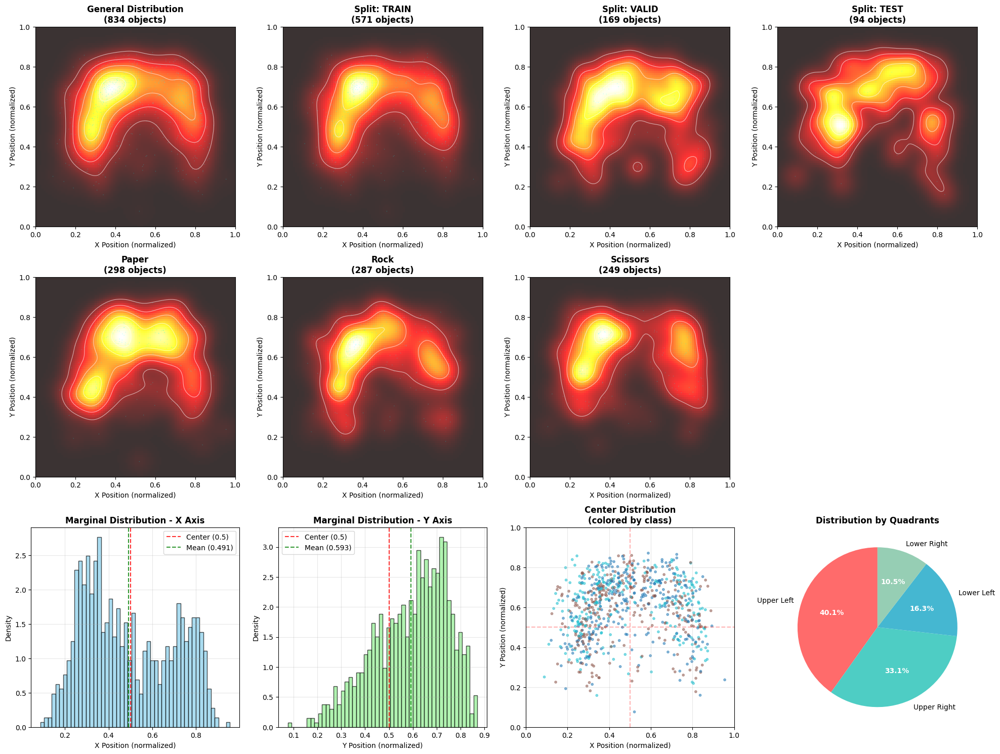

INFO: Creating class heatmaps...
INFO: Class heatmaps saved to: analysis/spatial_distribution_by_class.png


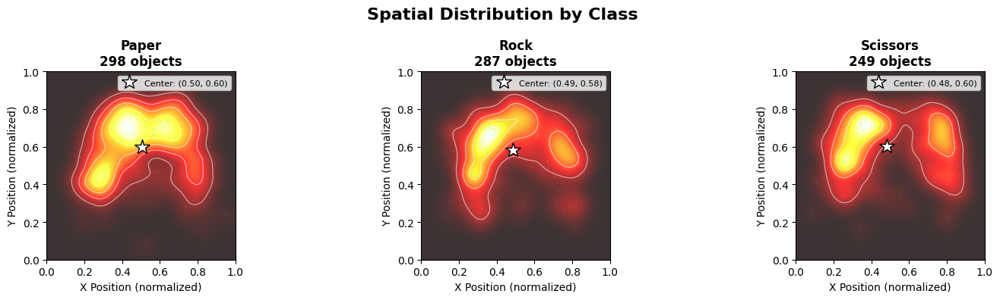

INFO: Analyzing spatial bias...
INFO: Spatial bias analysis saved to: analysis/spatial_bias_analysis.png


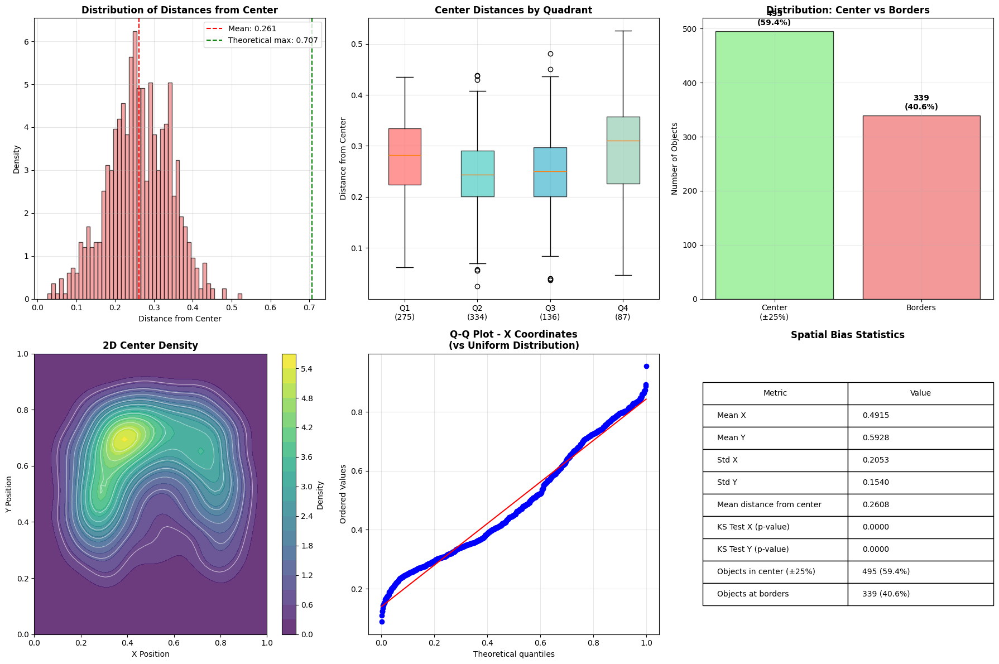

INFO: 
INFO: SPATIAL DISTRIBUTION ANALYSIS OF OBJECTS
INFO: ================================================================================
INFO: 
LOCATION STATISTICS:
INFO:    Total objects analyzed: 834
INFO:    Mean X coordinate: 0.4915 (ideal center: 0.5000)
INFO:    Mean Y coordinate: 0.5928 (ideal center: 0.5000)
INFO:    Standard deviation X: 0.2052
INFO:    Standard deviation Y: 0.1539
INFO:    Mean distance from center: 0.2608
INFO: 
UNIFORMITY TEST (Kolmogorov-Smirnov):
INFO:    X axis - p-value: 0.000000
INFO:    Y axis - p-value: 0.000000
INFO:    X distribution significantly different from uniform
INFO:    Y distribution significantly different from uniform
INFO: 
CONCENTRATION ANALYSIS:
INFO:    Objects in center (±25%): 59.4%
INFO:    Objects at borders: 40.6%
INFO: 
QUADRANT DISTRIBUTION:
INFO:    Q1 (Upper Right): 275 (33.0%)
INFO:    Q2 (Upper Left): 334 (40.0%)
INFO:    Q3 (Lower Left): 136 (16.3%)
INFO:    Q4 (Lower Right): 87 (10.4%)
INFO: 
Spatial analysis comple

In [6]:
import os
import logging
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import yaml
from collections import defaultdict
import pandas as pd
from scipy import stats
from sklearn.neighbors import KernelDensity
from scipy.stats import shapiro, kstest, gaussian_kde, probplot
from typing import Dict, List, Tuple, Optional, Any
from dataclasses import dataclass
import warnings
warnings.filterwarnings('ignore')

logging.basicConfig(level=logging.INFO, format="%(levelname)s: %(message)s")


@dataclass
class SpatialData:
    """Container for spatial distribution information."""
    split: str
    class_id: int
    x_center: float
    y_center: float
    width: float
    height: float
    file: str


@dataclass
class SpatialStatistics:
    """Container for spatial statistics results."""
    mean_x: float
    mean_y: float
    std_x: float
    std_y: float
    mean_distance_from_center: float
    ks_test_x_pvalue: float
    ks_test_y_pvalue: float
    center_objects_percentage: float
    quadrant_distribution: Dict[str, int]


class YOLOLabelReader:
    """Handles reading YOLO label files."""
    
    @staticmethod
    def read_yolo_labels(label_path: Path) -> List[Tuple[int, float, float, float, float]]:
        """Read YOLO label file and return list of bounding boxes."""
        boxes = []
        try:
            with open(label_path, 'r') as f:
                for line in f:
                    line = line.strip()
                    if line:
                        parts = line.split()
                        if len(parts) >= 5:
                            class_id = int(parts[0])
                            x_center = float(parts[1])
                            y_center = float(parts[2])
                            width = float(parts[3])
                            height = float(parts[4])
                            boxes.append((class_id, x_center, y_center, width, height))
        except Exception as e:
            logging.warning("Error reading %s: %s", label_path, e)
        return boxes


class SpatialDataExtractor:
    """Extracts spatial data from object center coordinates."""
    
    def __init__(self, dataset_path: str):
        self.dataset_path = Path(dataset_path)
    
    def extract_object_centers(self, splits: List[str] = ['train', 'valid', 'test']) -> Tuple[List[SpatialData], Dict[str, List[SpatialData]], Dict[int, List[Tuple[float, float]]]]:
        """Extract coordinates of all object centers."""
        all_centers = []
        split_centers = {}
        class_centers = defaultdict(list)
        
        logging.info("Extracting object center coordinates...")
        
        for split in splits:
            split_data = self._process_split(split)
            split_centers[split] = split_data
            all_centers.extend(split_data)
            
            # Organize by class
            for data in split_data:
                class_centers[data.class_id].append((data.x_center, data.y_center))
            
            logging.info("Split '%s': %d objects", split, len(split_data))
        
        return all_centers, split_centers, dict(class_centers)
    
    def _process_split(self, split: str) -> List[SpatialData]:
        """Process a single split to extract spatial data."""
        labels_dir = self.dataset_path / split / 'labels'
        
        if not labels_dir.exists():
            logging.warning("Directory not found: %s", labels_dir)
            return []
        
        split_data = []
        label_files = list(labels_dir.glob('*.txt'))
        
        for label_file in label_files:
            boxes = YOLOLabelReader.read_yolo_labels(label_file)
            
            for box in boxes:
                spatial_data = self._create_spatial_data(box, split, label_file.name)
                split_data.append(spatial_data)
        
        return split_data
    
    def _create_spatial_data(self, box: Tuple[int, float, float, float, float], 
                           split: str, filename: str) -> SpatialData:
        """Create SpatialData from raw box coordinates."""
        class_id, x_center, y_center, width, height = box
        
        return SpatialData(
            split=split,
            class_id=class_id,
            x_center=x_center,
            y_center=y_center,
            width=width,
            height=height,
            file=filename
        )


class HeatmapGenerator:
    """Generates KDE heatmaps for spatial distribution visualization."""
    
    DEFAULT_RESOLUTION = 100
    DEFAULT_BANDWIDTH = 0.05
    
    @staticmethod
    def create_heatmap_kde(x_coords: np.ndarray, y_coords: np.ndarray, 
                          title: str, ax, resolution: int = DEFAULT_RESOLUTION) -> Optional[Any]:
        """Create a heatmap using Kernel Density Estimation."""
        if len(x_coords) == 0:
            ax.text(0.5, 0.5, 'No data', ha='center', va='center', transform=ax.transAxes)
            ax.set_title(title, fontweight='bold')
            return None
        
        # Create grid for KDE
        x_min, x_max = 0, 1
        y_min, y_max = 0, 1
        
        xx, yy = np.meshgrid(
            np.linspace(x_min, x_max, resolution),
            np.linspace(y_min, y_max, resolution)
        )
        
        # Prepare data for KDE
        positions = np.vstack([xx.ravel(), yy.ravel()]).T
        values = np.vstack([x_coords, y_coords]).T
        
        # Apply KDE
        try:
            kde = KernelDensity(bandwidth=HeatmapGenerator.DEFAULT_BANDWIDTH, kernel='gaussian')
            kde.fit(values)
            density = np.exp(kde.score_samples(positions))
            density = density.reshape(xx.shape)
            
            return HeatmapGenerator._render_kde_heatmap(ax, density, xx, yy, x_coords, y_coords, title)
            
        except Exception as e:
            logging.warning("KDE error: %s", e)
            return HeatmapGenerator._fallback_visualization(ax, x_coords, y_coords, title)
    
    @staticmethod
    def _render_kde_heatmap(ax, density: np.ndarray, xx: np.ndarray, yy: np.ndarray,
                           x_coords: np.ndarray, y_coords: np.ndarray, title: str) -> Any:
        """Render KDE heatmap with contours and scatter points."""
        # Create heatmap
        im = ax.imshow(density, extent=[0, 1, 0, 1], 
                      origin='lower', cmap='hot', alpha=0.8, aspect='equal')
        
        # Add contours
        ax.contour(xx, yy, density, levels=5, colors='white', alpha=0.6, linewidths=0.8)
        
        # Scatter plot of original points
        ax.scatter(x_coords, y_coords, alpha=0.3, s=1, c='cyan', edgecolors='none')
        
        # Configure axes
        ax.set_xlim(0, 1)
        ax.set_ylim(0, 1)
        ax.set_title(title, fontweight='bold')
        ax.set_xlabel('X Position (normalized)')
        ax.set_ylabel('Y Position (normalized)')
        
        return im
    
    @staticmethod
    def _fallback_visualization(ax, x_coords: np.ndarray, y_coords: np.ndarray, title: str) -> Optional[Any]:
        """Fallback visualization methods if KDE fails."""
        try:
            # Try 2D histogram
            heatmap, xedges, yedges = np.histogram2d(x_coords, y_coords, bins=50, 
                                                   range=[[0, 1], [0, 1]])
            im = ax.imshow(heatmap.T, extent=[0, 1, 0, 1], origin='lower', 
                          cmap='hot', alpha=0.8, aspect='equal')
            
            ax.set_xlim(0, 1)
            ax.set_ylim(0, 1)
            ax.set_title(title, fontweight='bold')
            ax.set_xlabel('X Position (normalized)')
            ax.set_ylabel('Y Position (normalized)')
            
            return im
        except Exception as e2:
            logging.warning("Fallback error: %s", e2)
            # Last fallback - just scatter
            ax.scatter(x_coords, y_coords, alpha=0.5, s=10)
            ax.set_xlim(0, 1)
            ax.set_ylim(0, 1)
            ax.set_title(title, fontweight='bold')
            ax.set_xlabel('X Position (normalized)')
            ax.set_ylabel('Y Position (normalized)')
            return None


class SpatialVisualizer:
    """Creates spatial distribution visualizations."""
    
    def __init__(self, output_dir: str = './analysis'):
        self.output_dir = Path(output_dir)
        self.output_dir.mkdir(parents=True, exist_ok=True)
        
        # Configure plot style
        plt.style.use('default')
        self.colors = ['#FF6B6B', '#4ECDC4', '#45B7D1', '#96CEB4']
    
    def create_spatial_analysis_plots(self, all_centers: List[SpatialData], 
                                    split_centers: Dict[str, List[SpatialData]], 
                                    class_centers: Dict[int, List[Tuple[float, float]]], 
                                    class_names: List[str]) -> pd.DataFrame:
        """Create comprehensive spatial analysis plots."""
        if not all_centers:
            logging.warning("No data found for analysis.")
            return pd.DataFrame()
        
        df = pd.DataFrame([center.__dict__ for center in all_centers])
        
        # Create main figure with heatmaps
        fig, axes = plt.subplots(3, 4, figsize=(20, 15))
        axes = axes.flatten()
        
        self._create_heatmap_section(df, split_centers, class_centers, class_names, axes)
        self._create_distribution_section(df, axes)
        self._create_analysis_section(df, split_centers, axes)
        
        plt.tight_layout()
        
        # Save main plot
        main_plot_path = self.output_dir / 'spatial_distribution_heatmaps.png'
        plt.savefig(main_plot_path, dpi=300, bbox_inches='tight', facecolor='white')
        logging.info("Heatmaps saved to: %s", main_plot_path)
        plt.show()
        
        return df
    
    def create_detailed_heatmaps_by_class(self, class_centers: Dict[int, List[Tuple[float, float]]], 
                                        class_names: List[str]) -> None:
        """Create detailed heatmaps for each class separately."""
        if not class_centers:
            return
        
        # Determine grid layout
        n_classes = len(class_centers)
        cols = min(4, n_classes)
        rows = (n_classes + cols - 1) // cols
        
        if rows == 0:
            return
        
        fig, axes = self._setup_class_grid(rows, cols)
        self._plot_class_heatmaps(class_centers, class_names, axes, rows, cols)
        
        plt.suptitle('Spatial Distribution by Class', fontsize=16, fontweight='bold', y=0.98)
        plt.tight_layout()
        
        # Save class heatmaps
        class_heatmaps_path = self.output_dir / 'spatial_distribution_by_class.png'
        plt.savefig(class_heatmaps_path, dpi=300, bbox_inches='tight', facecolor='white')
        logging.info("Class heatmaps saved to: %s", class_heatmaps_path)
        plt.show()
    
    def _create_heatmap_section(self, df: pd.DataFrame, 
                              split_centers: Dict[str, List[SpatialData]], 
                              class_centers: Dict[int, List[Tuple[float, float]]], 
                              class_names: List[str], axes) -> None:
        """Create heatmap section of the main plot."""
        # 1. General heatmap (all data)
        all_x = df['x_center'].values
        all_y = df['y_center'].values
        HeatmapGenerator.create_heatmap_kde(all_x, all_y, f'General Distribution\n({len(df)} objects)', axes[0])
        
        # 2-4. Heatmaps by split
        split_idx = 1
        for split, data in split_centers.items():
            if data and split_idx < 4:
                split_df = pd.DataFrame([d.__dict__ for d in data])
                split_x = split_df['x_center'].values
                split_y = split_df['y_center'].values
                HeatmapGenerator.create_heatmap_kde(split_x, split_y, 
                                                  f'Split: {split.upper()}\n({len(data)} objects)', 
                                                  axes[split_idx])
                split_idx += 1
        
        # 5-8. Heatmaps by class (first 4 classes)
        class_idx = 4
        for class_id in sorted(class_centers.keys())[:4]:
            if class_idx < 8:
                centers = class_centers[class_id]
                if centers:
                    class_x = np.array([c[0] for c in centers])
                    class_y = np.array([c[1] for c in centers])
                    class_name = class_names[class_id] if class_id < len(class_names) else f'Class_{class_id}'
                    HeatmapGenerator.create_heatmap_kde(class_x, class_y, 
                                                      f'{class_name}\n({len(centers)} objects)', 
                                                      axes[class_idx])
                class_idx += 1
        
        # Turn off empty axes
        for idx in range(split_idx, 4):
            axes[idx].axis('off')
        for idx in range(class_idx, 8):
            axes[idx].axis('off')
    
    def _create_distribution_section(self, df: pd.DataFrame, axes) -> None:
        """Create marginal distribution section."""
        all_x = df['x_center'].values
        all_y = df['y_center'].values
        
        # 9. Marginal distribution X
        axes[8].hist(all_x, bins=50, alpha=0.7, color='skyblue', edgecolor='black', density=True)
        axes[8].axvline(0.5, color='red', linestyle='--', alpha=0.8, label='Center (0.5)')
        axes[8].axvline(all_x.mean(), color='green', linestyle='--', alpha=0.8, 
                       label=f'Mean ({all_x.mean():.3f})')
        axes[8].set_title('Marginal Distribution - X Axis', fontweight='bold')
        axes[8].set_xlabel('X Position (normalized)')
        axes[8].set_ylabel('Density')
        axes[8].legend()
        axes[8].grid(True, alpha=0.3)
        
        # 10. Marginal distribution Y
        axes[9].hist(all_y, bins=50, alpha=0.7, color='lightgreen', edgecolor='black', density=True)
        axes[9].axvline(0.5, color='red', linestyle='--', alpha=0.8, label='Center (0.5)')
        axes[9].axvline(all_y.mean(), color='green', linestyle='--', alpha=0.8, 
                       label=f'Mean ({all_y.mean():.3f})')
        axes[9].set_title('Marginal Distribution - Y Axis', fontweight='bold')
        axes[9].set_xlabel('Y Position (normalized)')
        axes[9].set_ylabel('Density')
        axes[9].legend()
        axes[9].grid(True, alpha=0.3)
    
    def _create_analysis_section(self, df: pd.DataFrame, 
                               split_centers: Dict[str, List[SpatialData]], axes) -> None:
        """Create analysis section with scatter plot and quadrant analysis."""
        all_x = df['x_center'].values
        all_y = df['y_center'].values
        
        # 11. Scatter plot with density
        scatter = axes[10].scatter(all_x, all_y, alpha=0.5, c=df['class_id'], 
                                  cmap='tab10', s=10)
        axes[10].set_title('Center Distribution\n(colored by class)', fontweight='bold')
        axes[10].set_xlabel('X Position (normalized)')
        axes[10].set_ylabel('Y Position (normalized)')
        axes[10].grid(True, alpha=0.3)
        axes[10].set_xlim(0, 1)
        axes[10].set_ylim(0, 1)
        
        # Add central grid lines
        axes[10].axhline(0.5, color='red', linestyle='--', alpha=0.3)
        axes[10].axvline(0.5, color='red', linestyle='--', alpha=0.3)
        
        # 12. Quadrant analysis
        quadrants = self._calculate_quadrants(df)
        
        wedges, texts, autotexts = axes[11].pie(quadrants.values(), labels=quadrants.keys(), 
                                               autopct='%1.1f%%', colors=self.colors, startangle=90)
        axes[11].set_title('Distribution by Quadrants', fontweight='bold')
        
        # Improve text appearance
        for autotext in autotexts:
            autotext.set_color('white')
            autotext.set_fontweight('bold')
    
    def _calculate_quadrants(self, df: pd.DataFrame) -> Dict[str, int]:
        """Calculate object distribution by quadrants."""
        return {
            'Upper Left': len(df[(df['x_center'] < 0.5) & (df['y_center'] > 0.5)]),
            'Upper Right': len(df[(df['x_center'] > 0.5) & (df['y_center'] > 0.5)]),
            'Lower Left': len(df[(df['x_center'] < 0.5) & (df['y_center'] < 0.5)]),
            'Lower Right': len(df[(df['x_center'] > 0.5) & (df['y_center'] < 0.5)])
        }
    
    def _setup_class_grid(self, rows: int, cols: int):
        """Setup grid for class heatmaps."""
        fig, axes = plt.subplots(rows, cols, figsize=(5*cols, 4*rows))
        
        # Ensure axes is always iterable
        if rows == 1 and cols == 1:
            axes = [axes]
        elif rows == 1:
            axes = axes.reshape(1, -1)
        elif cols == 1:
            axes = axes.reshape(-1, 1)
        
        return fig, axes
    
    def _plot_class_heatmaps(self, class_centers: Dict[int, List[Tuple[float, float]]], 
                           class_names: List[str], axes, rows: int, cols: int) -> None:
        """Plot heatmaps for each class."""
        class_idx = 0
        for i in range(rows):
            for j in range(cols):
                if class_idx < len(class_centers):
                    class_id = sorted(class_centers.keys())[class_idx]
                    centers = class_centers[class_id]
                    
                    # Get correct axis
                    ax = self._get_axis(axes, i, j, rows, cols)
                    
                    if centers:
                        self._plot_single_class_heatmap(ax, centers, class_id, class_names)
                    else:
                        ax.text(0.5, 0.5, 'No data', ha='center', va='center', transform=ax.transAxes)
                        ax.set_title(f'Class_{class_id}\n0 objects', fontweight='bold')
                    
                    class_idx += 1
                else:
                    # Turn off empty axes
                    ax = self._get_axis(axes, i, j, rows, cols)
                    ax.axis('off')
    
    def _get_axis(self, axes, i: int, j: int, rows: int, cols: int):
        """Get the correct axis for given grid position."""
        if rows == 1 and cols == 1:
            return axes[0]
        elif rows == 1:
            return axes[0, j]
        elif cols == 1:
            return axes[i, 0]
        else:
            return axes[i, j]
    
    def _plot_single_class_heatmap(self, ax, centers: List[Tuple[float, float]], 
                                 class_id: int, class_names: List[str]) -> None:
        """Plot heatmap for a single class."""
        class_x = np.array([c[0] for c in centers])
        class_y = np.array([c[1] for c in centers])
        class_name = class_names[class_id] if class_id < len(class_names) else f'Class_{class_id}'
        
        HeatmapGenerator.create_heatmap_kde(class_x, class_y, 
                                          f'{class_name}\n{len(centers)} objects', ax)
        
        # Add statistics
        mean_x, mean_y = np.mean(class_x), np.mean(class_y)
        ax.plot(mean_x, mean_y, 'w*', markersize=15, markeredgecolor='black', 
               markeredgewidth=1, label=f'Center: ({mean_x:.2f}, {mean_y:.2f})')
        ax.legend(loc='upper right', fontsize=8)


class SpatialBiasAnalyzer:
    """Analyzes spatial bias and creates statistical analysis plots."""
    
    def __init__(self, output_dir: str = './analysis'):
        self.output_dir = Path(output_dir)
    
    def analyze_spatial_bias(self, df: pd.DataFrame) -> SpatialStatistics:
        """Analyze spatial bias and create statistical analysis plots."""
        # Statistical tests
        center_x, center_y = 0.5, 0.5
        
        x_coords = df['x_center'].values
        y_coords = df['y_center'].values
        
        # Uniformity test (Kolmogorov-Smirnov)
        ks_stat_x, ks_p_x = kstest(x_coords, 'uniform')
        ks_stat_y, ks_p_y = kstest(y_coords, 'uniform')
        
        # Calculate distance from center
        distances = np.sqrt((x_coords - center_x)**2 + (y_coords - center_y)**2)
        
        # Quadrant analysis
        quadrant_counts = self._calculate_quadrant_counts(df)
        
        # Region analysis (center vs borders)
        center_region = len(df[(abs(df['x_center'] - 0.5) < 0.25) & (abs(df['y_center'] - 0.5) < 0.25)])
        
        # Create statistical analysis figure
        self._create_bias_analysis_plots(df, distances, quadrant_counts, center_region, ks_p_x, ks_p_y)
        
        return SpatialStatistics(
            mean_x=x_coords.mean(),
            mean_y=y_coords.mean(),
            std_x=x_coords.std(),
            std_y=y_coords.std(),
            mean_distance_from_center=distances.mean(),
            ks_test_x_pvalue=ks_p_x,
            ks_test_y_pvalue=ks_p_y,
            center_objects_percentage=(center_region / len(df)) * 100,
            quadrant_distribution=quadrant_counts
        )
    
    def _calculate_quadrant_counts(self, df: pd.DataFrame) -> Dict[str, int]:
        """Calculate object counts by quadrant."""
        return {
            'Q1 (Upper Right)': len(df[(df['x_center'] > 0.5) & (df['y_center'] > 0.5)]),
            'Q2 (Upper Left)': len(df[(df['x_center'] < 0.5) & (df['y_center'] > 0.5)]),
            'Q3 (Lower Left)': len(df[(df['x_center'] < 0.5) & (df['y_center'] < 0.5)]),
            'Q4 (Lower Right)': len(df[(df['x_center'] > 0.5) & (df['y_center'] < 0.5)])
        }
    
    def _create_bias_analysis_plots(self, df: pd.DataFrame, distances: np.ndarray, 
                                  quadrant_counts: Dict[str, int], center_region: int,
                                  ks_p_x: float, ks_p_y: float) -> None:
        """Create comprehensive bias analysis plots."""
        fig, axes = plt.subplots(2, 3, figsize=(18, 12))
        
        self._plot_distance_distribution(axes[0, 0], distances)
        self._plot_quadrant_boxplot(axes[0, 1], df, quadrant_counts)
        self._plot_center_vs_border_analysis(axes[0, 2], center_region, len(df))
        self._plot_2d_density(axes[1, 0], df)
        self._plot_qq_uniformity(axes[1, 1], df['x_center'].values)
        self._create_statistics_table(axes[1, 2], df, distances, center_region, ks_p_x, ks_p_y)
        
        plt.tight_layout()
        
        # Save bias analysis
        bias_analysis_path = self.output_dir / 'spatial_bias_analysis.png'
        plt.savefig(bias_analysis_path, dpi=300, bbox_inches='tight', facecolor='white')
        logging.info("Spatial bias analysis saved to: %s", bias_analysis_path)
        plt.show()
    
    def _plot_distance_distribution(self, ax, distances: np.ndarray) -> None:
        """Plot distribution of distances from center."""
        ax.hist(distances, bins=50, alpha=0.7, color='lightcoral', edgecolor='black', density=True)
        ax.axvline(distances.mean(), color='red', linestyle='--', 
                  label=f'Mean: {distances.mean():.3f}')
        ax.axvline(np.sqrt(2)/2, color='green', linestyle='--', 
                  label=f'Theoretical max: {np.sqrt(2)/2:.3f}')
        ax.set_title('Distribution of Distances from Center', fontweight='bold')
        ax.set_xlabel('Distance from Center')
        ax.set_ylabel('Density')
        ax.legend()
        ax.grid(True, alpha=0.3)
    
    def _plot_quadrant_boxplot(self, ax, df: pd.DataFrame, quadrant_counts: Dict[str, int]) -> None:
        """Plot box plot of distances by quadrant."""
        quadrant_data = []
        quadrant_labels = []
        
        for quad, count in quadrant_counts.items():
            if 'Upper Right' in quad:
                data = df[(df['x_center'] > 0.5) & (df['y_center'] > 0.5)]
            elif 'Upper Left' in quad:
                data = df[(df['x_center'] < 0.5) & (df['y_center'] > 0.5)]
            elif 'Lower Left' in quad:
                data = df[(df['x_center'] < 0.5) & (df['y_center'] < 0.5)]
            else:  # Lower Right
                data = df[(df['x_center'] > 0.5) & (df['y_center'] < 0.5)]
            
            if len(data) > 0:
                quadrant_distances = np.sqrt((data['x_center'] - 0.5)**2 + (data['y_center'] - 0.5)**2)
                quadrant_data.append(quadrant_distances)
                quadrant_labels.append(f'{quad.split()[0]}\n({count})')
        
        if quadrant_data:
            box_plot = ax.boxplot(quadrant_data, labels=quadrant_labels, patch_artist=True)
            colors = ['#FF6B6B', '#4ECDC4', '#45B7D1', '#96CEB4']
            for patch, color in zip(box_plot['boxes'], colors):
                patch.set_facecolor(color)
                patch.set_alpha(0.7)
        
        ax.set_title('Center Distances by Quadrant', fontweight='bold')
        ax.set_ylabel('Distance from Center')
        ax.grid(True, alpha=0.3)
    
    def _plot_center_vs_border_analysis(self, ax, center_region: int, total_objects: int) -> None:
        """Plot center vs border distribution analysis."""
        border_region = total_objects - center_region
        regions = ['Center\n(±25%)', 'Borders']
        region_counts = [center_region, border_region]
        colors = ['lightgreen', 'lightcoral']
        
        bars = ax.bar(regions, region_counts, color=colors, alpha=0.8, edgecolor='black')
        ax.set_title('Distribution: Center vs Borders', fontweight='bold')
        ax.set_ylabel('Number of Objects')
        ax.grid(True, alpha=0.3)
        
        # Add percentages
        total = sum(region_counts)
        for bar, count in zip(bars, region_counts):
            percentage = count / total * 100
            ax.text(bar.get_x() + bar.get_width()/2., bar.get_height() + total*0.01,
                   f'{count}\n({percentage:.1f}%)', ha='center', va='bottom', fontweight='bold')
    
    def _plot_2d_density(self, ax, df: pd.DataFrame) -> None:
        """Plot 2D density with contours."""
        x_coords = df['x_center'].values
        y_coords = df['y_center'].values
        
        try:
            xy = np.vstack([x_coords, y_coords])
            density = gaussian_kde(xy)
            
            # Create grid
            x_grid = np.linspace(0, 1, 50)
            y_grid = np.linspace(0, 1, 50)
            X, Y = np.meshgrid(x_grid, y_grid)
            positions = np.vstack([X.ravel(), Y.ravel()])
            Z = density(positions).reshape(X.shape)
            
            # Plot density
            im = ax.contourf(X, Y, Z, levels=20, cmap='viridis', alpha=0.8)
            ax.contour(X, Y, Z, levels=10, colors='white', alpha=0.6, linewidths=0.8)
            plt.colorbar(im, ax=ax, label='Density')
            
        except Exception:
            # Fallback to scatter plot
            ax.scatter(x_coords, y_coords, alpha=0.5, s=10)
        
        ax.set_title('2D Center Density', fontweight='bold')
        ax.set_xlabel('X Position')
        ax.set_ylabel('Y Position')
        ax.set_xlim(0, 1)
        ax.set_ylim(0, 1)
    
    def _plot_qq_uniformity(self, ax, x_coords: np.ndarray) -> None:
        """Plot Q-Q plot to test uniformity."""
        probplot(x_coords, dist="uniform", plot=ax)
        ax.set_title('Q-Q Plot - X Coordinates\n(vs Uniform Distribution)', fontweight='bold')
        ax.grid(True, alpha=0.3)
    
    def _create_statistics_table(self, ax, df: pd.DataFrame, distances: np.ndarray, 
                               center_region: int, ks_p_x: float, ks_p_y: float) -> None:
        """Create statistics table."""
        ax.axis('off')
        
        # Create statistics table
        stats_data = [
            ['Metric', 'Value'],
            ['Mean X', f'{df["x_center"].mean():.4f}'],
            ['Mean Y', f'{df["y_center"].mean():.4f}'],
            ['Std X', f'{df["x_center"].std():.4f}'],
            ['Std Y', f'{df["y_center"].std():.4f}'],
            ['Mean distance from center', f'{distances.mean():.4f}'],
            ['KS Test X (p-value)', f'{ks_p_x:.4f}'],
            ['KS Test Y (p-value)', f'{ks_p_y:.4f}'],
            ['Objects in center (±25%)', f'{center_region} ({center_region/len(df)*100:.1f}%)'],
            ['Objects at borders', f'{len(df)-center_region} ({(len(df)-center_region)/len(df)*100:.1f}%)']
        ]
        
        table = ax.table(cellText=stats_data[1:], colLabels=stats_data[0], 
                        cellLoc='left', loc='center')
        table.auto_set_font_size(False)
        table.set_fontsize(10)
        table.scale(1, 2)
        ax.set_title('Spatial Bias Statistics', fontweight='bold', pad=20)


class SpatialStatisticsReporter:
    """Handles reporting of spatial statistics and recommendations."""
    
    @staticmethod
    def print_spatial_statistics(stats: SpatialStatistics, df: pd.DataFrame) -> None:
        """Print detailed spatial distribution statistics."""
        logging.info("\n" + "="*80)
        logging.info("SPATIAL DISTRIBUTION ANALYSIS OF OBJECTS")
        logging.info("="*80)
        
        SpatialStatisticsReporter._print_location_statistics(stats, len(df))
        SpatialStatisticsReporter._print_uniformity_tests(stats)
        SpatialStatisticsReporter._print_concentration_analysis(stats)
        SpatialStatisticsReporter._print_quadrant_distribution(stats, len(df))
    
    @staticmethod
    def _print_location_statistics(stats: SpatialStatistics, total_objects: int) -> None:
        """Print location statistics."""
        logging.info("\nLOCATION STATISTICS:")
        logging.info("   Total objects analyzed: %d", total_objects)
        logging.info("   Mean X coordinate: %.4f (ideal center: 0.5000)", stats.mean_x)
        logging.info("   Mean Y coordinate: %.4f (ideal center: 0.5000)", stats.mean_y)
        logging.info("   Standard deviation X: %.4f", stats.std_x)
        logging.info("   Standard deviation Y: %.4f", stats.std_y)
        logging.info("   Mean distance from center: %.4f", stats.mean_distance_from_center)
    
    @staticmethod
    def _print_uniformity_tests(stats: SpatialStatistics) -> None:
        """Print uniformity test results."""
        logging.info("\nUNIFORMITY TEST (Kolmogorov-Smirnov):")
        logging.info("   X axis - p-value: %.6f", stats.ks_test_x_pvalue)
        logging.info("   Y axis - p-value: %.6f", stats.ks_test_y_pvalue)
        
        if stats.ks_test_x_pvalue < 0.05:
            logging.info("   X distribution significantly different from uniform")
        else:
            logging.info("   X distribution approximately uniform")
            
        if stats.ks_test_y_pvalue < 0.05:
            logging.info("   Y distribution significantly different from uniform")
        else:
            logging.info("   Y distribution approximately uniform")
    
    @staticmethod
    def _print_concentration_analysis(stats: SpatialStatistics) -> None:
        """Print concentration analysis."""
        logging.info("\nCONCENTRATION ANALYSIS:")
        logging.info("   Objects in center (±25%%): %.1f%%", stats.center_objects_percentage)
        logging.info("   Objects at borders: %.1f%%", 100 - stats.center_objects_percentage)
    
    @staticmethod
    def _print_quadrant_distribution(stats: SpatialStatistics, total_objects: int) -> None:
        """Print quadrant distribution."""
        logging.info("\nQUADRANT DISTRIBUTION:")
        for quadrant, count in stats.quadrant_distribution.items():
            percentage = count / total_objects * 100
            logging.info("   %s: %d (%.1f%%)", quadrant, count, percentage)


class SpatialDistributionAnalyzer:
    """Main class for analyzing spatial distribution in datasets."""
    
    def __init__(self, dataset_path: str = './data', output_dir: str = './analysis'):
        self.dataset_path = dataset_path
        self.output_dir = output_dir
        self.extractor = SpatialDataExtractor(dataset_path)
        self.visualizer = SpatialVisualizer(output_dir)
        self.bias_analyzer = SpatialBiasAnalyzer(output_dir)
    
    def analyze(self, splits: List[str] = ['train', 'valid', 'test'], 
               yaml_path: Optional[str] = None) -> Tuple[pd.DataFrame, SpatialStatistics]:
        """Run complete spatial distribution analysis."""
        logging.info("Starting spatial distribution analysis...")
        
        # Load class names
        class_names = self._load_class_names(yaml_path)
        
        # Extract object centers
        all_centers, split_centers, class_centers = self.extractor.extract_object_centers(splits)
        
        if not all_centers:
            logging.warning("No objects found in dataset.")
            return pd.DataFrame(), SpatialStatistics(0, 0, 0, 0, 0, 0, 0, 0, {})
        
        # Create main heatmaps
        logging.info("\nCreating heatmaps...")
        df = self.visualizer.create_spatial_analysis_plots(all_centers, split_centers, class_centers, class_names)
        
        # Create detailed class heatmaps
        logging.info("Creating class heatmaps...")
        self.visualizer.create_detailed_heatmaps_by_class(class_centers, class_names)
        
        # Analyze spatial bias
        logging.info("Analyzing spatial bias...")
        stats = self.bias_analyzer.analyze_spatial_bias(df)
        
        # Print statistics
        SpatialStatisticsReporter.print_spatial_statistics(stats, df)
        
        logging.info("\nSpatial analysis completed!")
        logging.info("Files saved in: %s", self.output_dir)
        logging.info("   - spatial_distribution_heatmaps.png")
        logging.info("   - spatial_distribution_by_class.png")
        logging.info("   - spatial_bias_analysis.png")
        
        return df, stats
    
    def analyze_from_yaml(self, yaml_path: str = './data/data.yaml') -> Tuple[pd.DataFrame, SpatialStatistics]:
        """Execute analysis using YAML configuration file."""
        yaml_file = Path(yaml_path)
        
        if not yaml_file.exists():
            logging.error("YAML file not found: %s", yaml_path)
            return pd.DataFrame(), SpatialStatistics(0, 0, 0, 0, 0, 0, 0, 0, {})
        
        # Determine dataset path
        dataset_path = yaml_file.parent
        
        # Update extractor with new dataset path
        self.extractor = SpatialDataExtractor(str(dataset_path))
        
        return self.analyze(yaml_path=str(yaml_file))
    
    def _load_class_names(self, yaml_path: Optional[str]) -> List[str]:
        """Load class names from YAML file."""
        class_names = []
        
        if yaml_path and Path(yaml_path).exists():
            try:
                with open(yaml_path, 'r') as f:
                    config = yaml.safe_load(f)
                    class_names = config.get('names', [])
            except Exception as e:
                logging.warning("Error loading YAML file: %s", e)
        
        if not class_names:
            logging.warning("Class names not found. Using numeric IDs.")
            class_names = [f'Class_{i}' for i in range(20)]
        
        return class_names

try:
    analyzer = SpatialDistributionAnalyzer(
        dataset_path='./data',
        output_dir='./analysis'
    )

    results = analyzer.analyze_from_yaml('./data/data.yaml')
    
except Exception as e:
    logging.error("Error during analysis: %s", e)